In [ ]:
# #   leggo il csv
# Con il tuo DataFrame puoi fare:

# Raggruppamenti con groupby() per osservare metriche aggregate per Division, Settimana, ecc.
# Analisi temporali per osservare come le metriche cambiano nel tempo.
# Analisi delle correlazioni per scoprire relazioni tra metriche.
# Calcoli di metriche derivate (come percentuali, rapporti, conversion rate).
# Analisi con condizioni specifiche (filtraggio).
# Visualizzazioni per ottenere una panoramica chiara dei dati
# #   

### Importo le librerie

In [2]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import warnings
warnings.filterwarnings('ignore')

Creo un dataframe leggendo il file csv

In [3]:
df = pd.read_csv('Sample Media Spend Data.csv')
df['Calendar_Week'] = pd.to_datetime(df['Calendar_Week'])
df_columns = df.columns
# Ordinare il DataFrame in ordine crescente in base alla colonna 'data'
#df = df.sort_values(by='Calendar_Week').reset_index(drop=True)
# Converti tutte le colonne in numeri, se possibile
#df_converted = df.apply(pd.to_numeric, errors='coerce')
df1 = df.loc[:,df_columns[2:]]
df.head()

,Division,Calendar_Week,Paid_Views,Organic_Views,Google_Impressions,Email_Impressions,Facebook_Impressions,Affiliate_Impressions,Overall_Views,Sales
0,A,2018-01-06,392,422,408,349895.0107,73580,12072,682,59417
1,A,2018-01-13,787,904,110,506270.2176,11804,9499,853,56806
2,A,2018-01-20,81,970,742,430042.1538,52232,17048,759,48715
3,A,2018-01-27,25,575,65,417745.6658,78640,10207,942,72047
4,A,2018-02-03,565,284,295,408505.8012,40561,5834,658,56235


### Creo una funzione che mi smista le colonne colonne numeriche da quelle categoriche

In [4]:
def get_num_cat_columns(df):
    numerics = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']
    num = df.select_dtypes(include=numerics).columns.to_list()
    cat = df.select_dtypes(include=['object', 'datetime']).columns.to_list()
    return num, cat

numeric_columns, categorical_columns  = get_num_cat_columns(df)
numeric_columns, categorical_columns

(['Paid_Views',
  'Organic_Views',
  'Google_Impressions',
  'Email_Impressions',
  'Facebook_Impressions',
  'Affiliate_Impressions',
  'Overall_Views',
  'Sales'],
 ['Division', 'Calendar_Week'])

In [ ]:
#df['Calendar_Week'] = pd.to_datetime(df['Calendar_Week'])

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3051 entries, 0 to 3050
Data columns (total 10 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   Division               3051 non-null   object        
 1   Calendar_Week          3051 non-null   datetime64[ns]
 2   Paid_Views             3051 non-null   int64         
 3   Organic_Views          3051 non-null   int64         
 4   Google_Impressions     3051 non-null   int64         
 5   Email_Impressions      3051 non-null   float64       
 6   Facebook_Impressions   3051 non-null   int64         
 7   Affiliate_Impressions  3051 non-null   int64         
 8   Overall_Views          3051 non-null   int64         
 9   Sales                  3051 non-null   int64         
dtypes: datetime64[ns](1), float64(1), int64(7), object(1)
memory usage: 238.5+ KB


In [6]:
df.isnull().sum()

Division                 0
Calendar_Week            0
Paid_Views               0
Organic_Views            0
Google_Impressions       0
Email_Impressions        0
Facebook_Impressions     0
Affiliate_Impressions    0
Overall_Views            0
Sales                    0
dtype: int64

In [7]:
# Restituisce il numero totale di righe duplicate
df.duplicated().sum()

# Se ci fossero stai dei duplicati sarebbero stati tolti con
#df = df.drop_duplicates(ignore_index=True)

0

In [8]:
df1.describe().round(2)

,Paid_Views,Organic_Views,Google_Impressions,Email_Impressions,Facebook_Impressions,Affiliate_Impressions,Overall_Views,Sales
count,3051.00,3051.00,3051.00,3051.00,3051.00,3051.00,3051.00,3051.0
mean,15093.94,13355.67,886173.83,760509.38,269126.89,22910.90,27980.91,185901.4
std,30785.88,24079.40,1355075.82,626014.12,466511.67,21617.64,52054.98,232207.9
min,1.00,1.00,7.00,40894.45,29.00,910.00,2.00,15436.0
25%,537.00,712.50,169828.00,378496.92,57073.50,9127.00,747.00,73393.5
50%,2699.00,4110.00,490531.00,590970.80,127523.00,16658.00,7879.00,113573.0
75%,17358.00,16230.50,1022621.50,962246.61,283505.00,27486.50,34111.50,202975.5
max,518190.00,270453.00,17150439.00,7317730.25,7558435.00,175791.00,635057.00,3575430.0


In [9]:
df1.corr().round(2)

,Paid_Views,Organic_Views,Google_Impressions,Email_Impressions,Facebook_Impressions,Affiliate_Impressions,Overall_Views,Sales
Paid_Views,1.00,0.80,0.31,0.29,0.32,0.22,0.96,0.29
Organic_Views,0.80,1.00,0.43,0.34,0.41,0.23,0.93,0.39
Google_Impressions,0.31,0.43,1.00,0.64,0.73,0.35,0.38,0.78
Email_Impressions,0.29,0.34,0.64,1.00,0.52,0.70,0.33,0.75
Facebook_Impressions,0.32,0.41,0.73,0.52,1.00,0.29,0.38,0.75
Affiliate_Impressions,0.22,0.23,0.35,0.70,0.29,1.00,0.23,0.44
Overall_Views,0.96,0.93,0.38,0.33,0.38,0.23,1.00,0.35
Sales,0.29,0.39,0.78,0.75,0.75,0.44,0.35,1.00


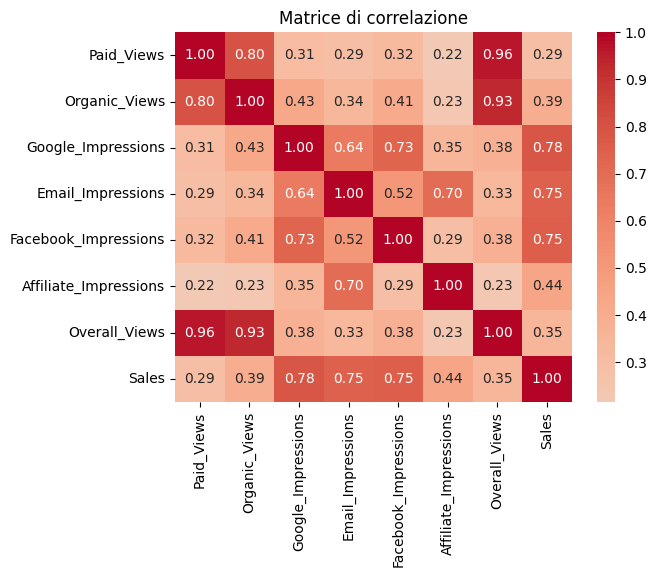

In [10]:
#plt.figure(figsize=(20,10))
sns.heatmap(df1.corr(), annot=True, cmap='coolwarm', fmt=".2f", center=0)
plt.title('Matrice di correlazione')
plt.show()

ok


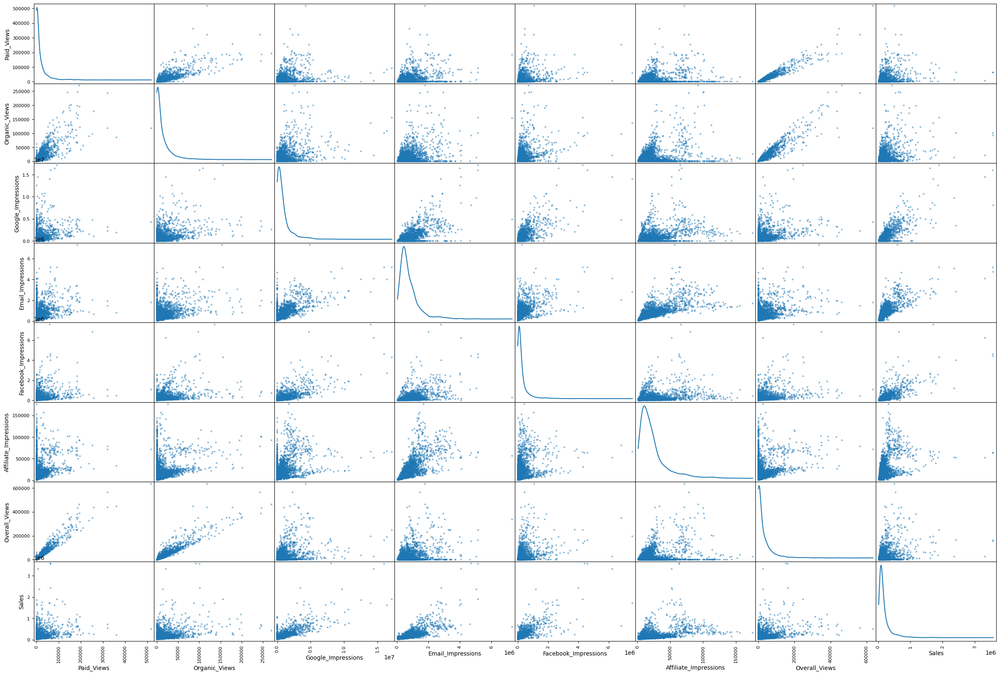

In [11]:
# Crea la scatter matrix con la configurazione desiderata
pd.plotting.scatter_matrix(df1, figsize=(30, 20), diagonal='kde')
print('ok')

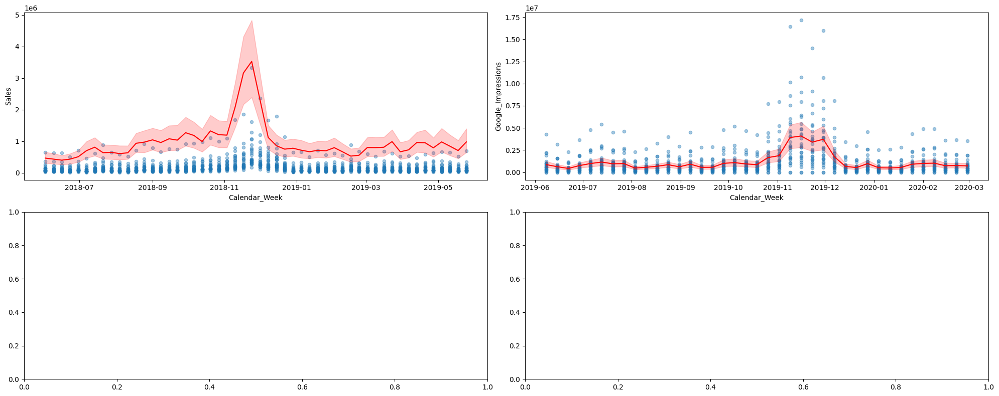

In [89]:
fig, axes = plt.subplots(2, 2, figsize=(20, 8))

# Lista delle colonne che vogliamo mappare dinamicamente
y_columns = ['Sales', 'Google_Impressions', 'Email_Impressions', 'Facebook_Impressions']

df_primo_picco_vendite = df.loc[(df['Calendar_Week'] > '2018-06-01') & (df['Calendar_Week'] < '2019-06-01')]
df_secondo_picco_vendite = df.loc[(df['Calendar_Week'] > '2019-06-01') & (df['Calendar_Week'] < '2020-06-01')]

# Sottoinsiemi dei dati
datasets = [df_primo_picco_vendite, df_secondo_picco_vendite]

# Iterazione dinamica attraverso ciascun grafico
for idx, (data, ax, y_var) in enumerate(zip(datasets, axes.flatten(), y_columns)):
    if idx < 2:  # Prima riga con 'Sales' e 'Google_Impressions'
        data.plot(kind='scatter', x='Calendar_Week', y=y_var, ax=ax, alpha=0.4)
        sns.lineplot(data=data, x='Calendar_Week', y='Google_Impressions', ax=ax, color='red')
    else:  # Seconda riga con scatterplot e lineplot
        sns.scatterplot(data=data, x='Calendar_Week', y=y_var, ax=ax, alpha=0.4, label='Scatterplot')
        sns.lineplot(data=data, x='Calendar_Week', y='Google_Impressions', ax=ax, color='red')

plt.tight_layout()
plt.show()


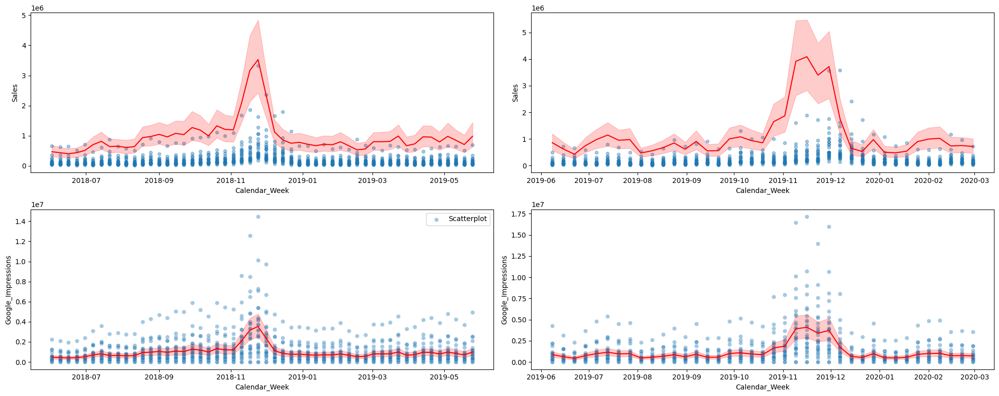

In [87]:
fig, axes = plt.subplots(2, 2, figsize=(20, 8))
#print(df['Calendar_Week'].head())
df_primo_picco_vendite = df.loc[(df['Calendar_Week'] > '2018-06-01') & (df['Calendar_Week'] < '2019-06-01')]
df_secondo_picco_vendite = df.loc[(df['Calendar_Week'] > '2019-06-01') & (df['Calendar_Week'] < '2020-06-01')]


df_primo_picco_vendite.plot(kind='scatter', x='Calendar_Week', y='Sales',ax=axes[0,0], alpha=0.4)
sns.lineplot(data = df_primo_picco_vendite, x='Calendar_Week', y='Google_Impressions',ax=axes[0,0], color = 'red')


df_secondo_picco_vendite.plot(kind='scatter', x='Calendar_Week', y='Sales',ax=axes[0,1], alpha=0.4)
sns.lineplot(data = df_secondo_picco_vendite, x='Calendar_Week', y='Google_Impressions',ax=axes[0,1], color = 'red')


sns.scatterplot(data = df_primo_picco_vendite, x='Calendar_Week', y='Google_Impressions',ax=axes[1,0], alpha=0.4, label='Scatterplot')#).plot(kind='kde', x='Calendar_Week', y='Google_Impressions',ax=axes[1,0])
sns.lineplot(data = df_primo_picco_vendite, x='Calendar_Week', y='Google_Impressions',ax=axes[1,0], color = 'red')


sns.scatterplot(data = df_secondo_picco_vendite, x='Calendar_Week', y='Google_Impressions',ax=axes[1,1], alpha=0.4)#).plot(kind='kde', x='Calendar_Week', y='Google_Impressions',ax=axes[1,0])
sns.lineplot(data = df_secondo_picco_vendite, x='Calendar_Week', y='Google_Impressions',ax=axes[1,1], color = 'red')

plt.tight_layout()
#print(df3.describe())
plt.show()
#df3.describe().round(2)

In [67]:
print(df.iloc[:,1:].columns)

Index(['Calendar_Week', 'Paid_Views', 'Organic_Views', 'Google_Impressions',
       'Email_Impressions', 'Facebook_Impressions', 'Affiliate_Impressions',
       'Overall_Views', 'Sales'],
      dtype='object')


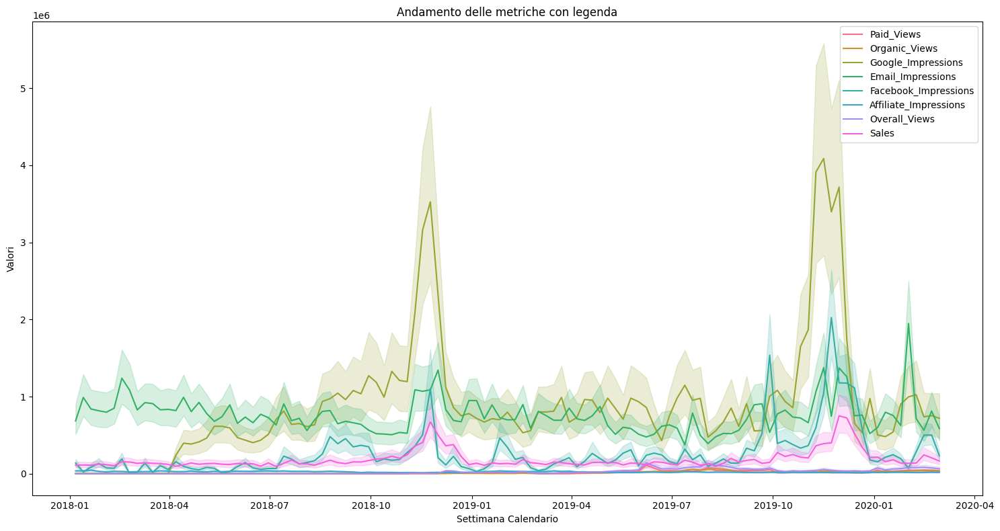

In [75]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np


# Creazione di una versione lunga del DataFrame
df_melted = df.melt(id_vars='Calendar_Week', value_vars=df.columns[1:], var_name='Metric', value_name='Value')

# Creazione del grafico con seaborn e legenda
plt.figure(figsize=(15, 8))
#sns.lineplot(data=df_melted, x='Calendar_Week', y='Value', hue='Metric', palette='viridis')
sns.lineplot(data=df_melted, x='Calendar_Week', y='Value', hue='Metric', palette=sns.color_palette("husl", len(df_melted['Metric'].unique())))

# Ottimizzazione e visualizzazione
plt.title('Andamento delle metriche con legenda')
plt.xlabel('Settimana Calendario')
plt.ylabel('Valori')
plt.legend(loc='best')
plt.tight_layout()
plt.show()


In [ ]:
# Raggruppa metriche in cluster (modifica a seconda della struttura dei dati)
group1 = ['Organic_Views', 'Metric_A', 'Metric_B']
group2 = ['Metric_C', 'Metric_D', 'Metric_E']
group3 = ['Metric_F', 'Metric_G', 'Metric_H']

# Creazione di sottoplot per ciascun gruppo
fig, axes = plt.subplots(1, 3, figsize=(15, 6))

sns.lineplot(data=df_melted[df_melted['Metric'].isin(group1)], x='Calendar_Week', y='Value', hue='Metric', ax=axes[0], palette="viridis")
axes[0].set_title('Gruppo 1')

sns.lineplot(data=df_melted[df_melted['Metric'].isin(group2)], x='Calendar_Week', y='Value', hue='Metric', ax=axes[1], palette="viridis")
axes[1].set_title('Gruppo 2')

sns.lineplot(data=df_melted[df_melted['Metric'].isin(group3)], x='Calendar_Week', y='Value', hue='Metric', ax=axes[2], palette="viridis")
axes[2].set_title('Gruppo 3')

plt.tight_layout()
plt.show()


# Analisi grafici basati sul tempo
Come si può notare dai grafici, prendendo come riferimento l'ultimo in basso a destra, ovvero quello che mostra le vendite di settimana in settimana


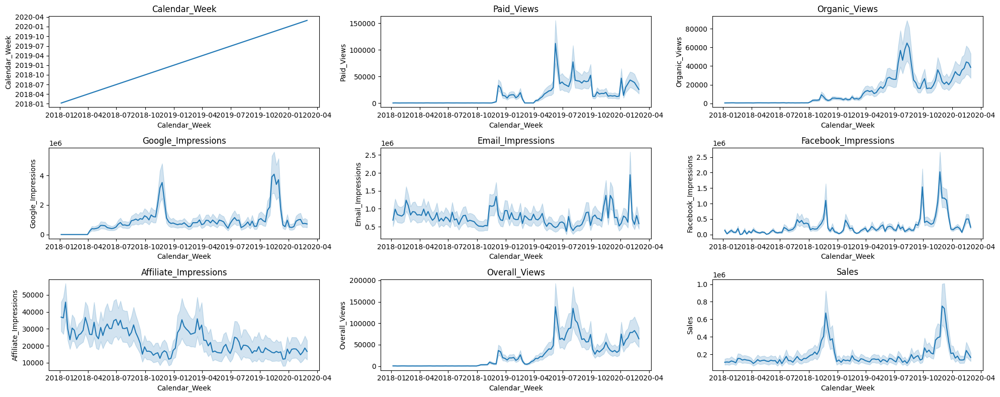

In [78]:
import numpy as np

# Creazione della griglia di grafici
fig, axes = plt.subplots(3, 3, figsize=(20, 8))  # Griglia 3x3 di grafici


# Lista delle metriche da visualizzare
colonne = df.iloc[:,1:].columns

# Ciclo per iterare sugli assi e disegnare il lineplot
for idx, (row, col) in enumerate(np.ndindex(axes.shape)):
    # Evitiamo di superare la lunghezza delle metriche disponibili
    if idx < len(colonne):
        sns.lineplot(data=df, x='Calendar_Week', y=colonne[idx], ax=axes[row, col])
        axes[row, col].set_title(f'{colonne[idx]}')
    else:
        # Se ci sono spazi vuoti nella griglia, nascondiamo l'asse
        axes[row, col].axis('off')

# Ottimizzare la visualizzazione
plt.tight_layout()
plt.show()


In [76]:
print(df.head())
print(df_melted.head())


  Division Calendar_Week  Paid_Views  Organic_Views  Google_Impressions  \
0        A    2018-01-06         392            422                 408   
1        A    2018-01-13         787            904                 110   
2        A    2018-01-20          81            970                 742   
3        A    2018-01-27          25            575                  65   
4        A    2018-02-03         565            284                 295   

   Email_Impressions  Facebook_Impressions  Affiliate_Impressions  \
0        349895.0107                 73580                  12072   
1        506270.2176                 11804                   9499   
2        430042.1538                 52232                  17048   
3        417745.6658                 78640                  10207   
4        408505.8012                 40561                   5834   

   Overall_Views  Sales  
0            682  59417  
1            853  56806  
2            759  48715  
3            942  72047  
4   

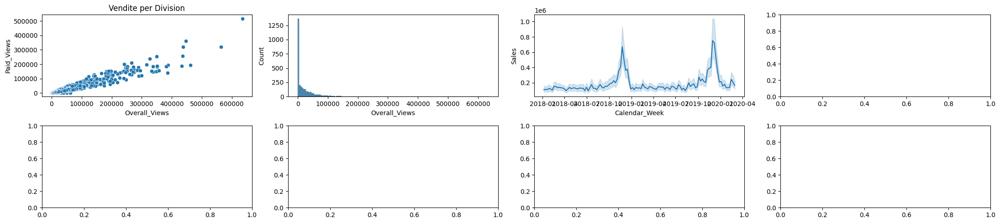

In [ ]:
fig, axes = plt.subplots(2, 4, figsize=(22, 5))

sns.scatterplot(data = df1, x='Overall_Views', y='Paid_Views', ax=axes[0,0])
axes[0, 0].set_title('Vendite per Division')

sns.histplot(data = df1['Overall_Views'], ax=axes[0,1])

sns.lineplot(data = df, x='Calendar_Week', y='Sales', ax=axes[0,2])

#sns.barplot(data = df1, x='Overall_Views', y='Paid_Views', ax=axes[0,1])
#axes[0, 1].set_title('Vendite per Division')


plt.tight_layout()
plt.show()


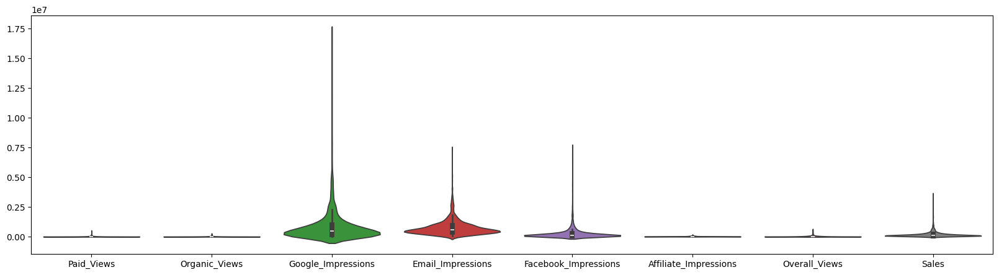

In [12]:
#df1.plot(kind='box', figsize=(20,5))#, y=df.columns[1])#, figsize=(20,10))
plt.figure(figsize=(20,5))
sns.violinplot(df1)
plt.show()


In [9]:
df2 = df.groupby('Division')['Sales'].agg(['sum', 'mean', 'count', 'median'])
df2.round(2)
#for x, y in df2:
 #   print(x,y)

,sum,mean,count,median
Division,,,,
A,11683210,103391.24,113,81055.0
B,99002756,876130.58,113,665200.0
C,9225321,81640.01,113,64558.0
D,22785935,201645.44,113,156648.0
E,51751484,457977.73,113,358299.0
F,12935321,114471.87,113,87466.0
G,22167862,196175.77,113,149876.0
H,10429504,92296.50,113,73274.0
I,13504117,119505.46,113,92219.0


<Axes: >

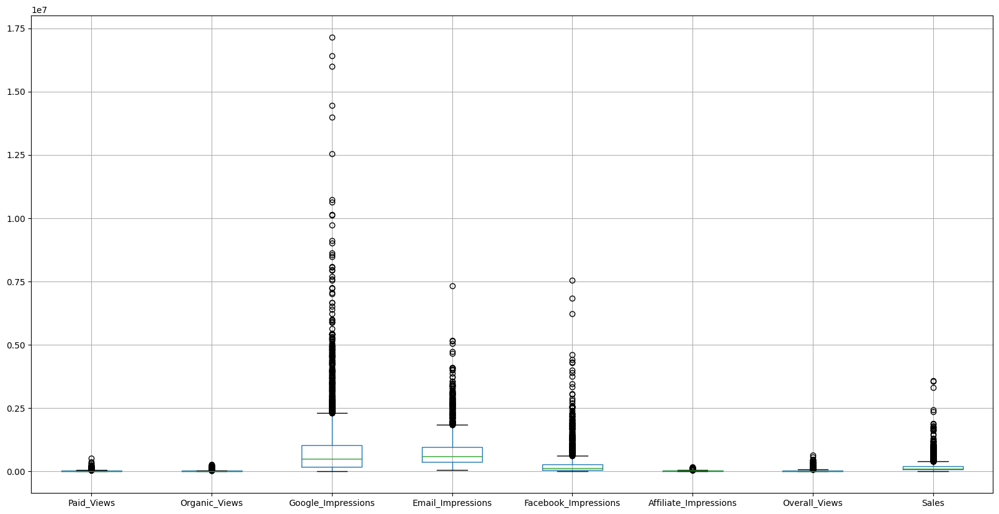

In [14]:
pd.plotting.boxplot(df1, figsize=(20,10))

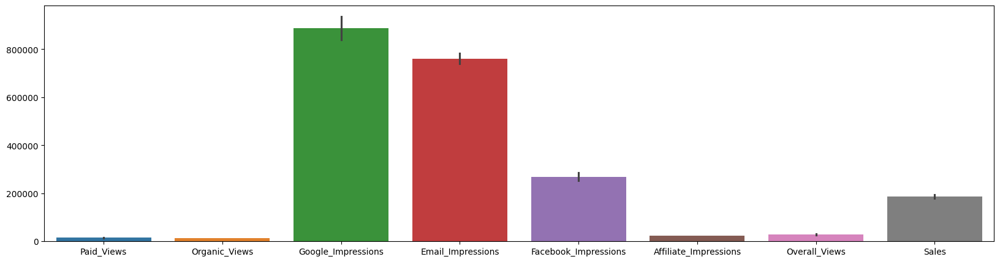

In [22]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(20,5))
sns.barplot(data=df1)#, x='categoria', y='valore')
plt.show()


Index(['Division', 'Calendar_Week', 'Paid_Views', 'Organic_Views',
       'Google_Impressions', 'Email_Impressions', 'Facebook_Impressions',
       'Affiliate_Impressions', 'Overall_Views', 'Sales'],
      dtype='object')


<Axes: xlabel='Paid_Views', ylabel='Sales'>

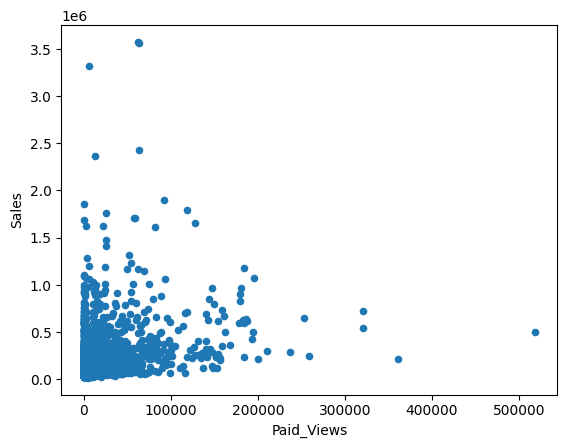

In [23]:
print(df.columns)
df1.plot(kind='scatter', x='Paid_Views', y='Sales')#, kind='kde')

In [24]:
df.groupby('Calendar_Week')[['Paid_Views', 'Organic_Views', 'Sales']].sum().reset_index()

,Calendar_Week,Paid_Views,Organic_Views,Sales
0,2018-01-06,11247,11214,2961900
1,2018-01-13,15453,12580,3043768
2,2018-01-20,12759,13145,2967530
3,2018-01-27,10709,15208,3359958
4,2018-02-03,13416,15129,3156423
...,...,...,...,...
108,2020-02-01,1173102,958532,3637978
109,2020-02-08,1114954,1015916,3723924
110,2020-02-15,1047385,1199619,6589887
111,2020-02-22,870117,1173041,5556582


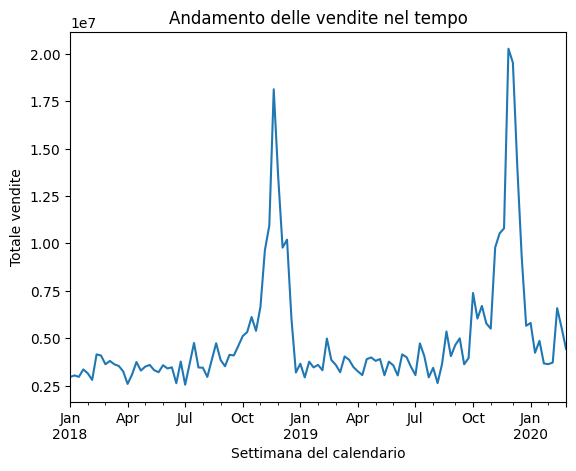

In [ ]:
#import matplotlib.pyplot as plt

df.groupby('Calendar_Week')['Sales'].sum().plot()
plt.title("Andamento delle vendite nel tempo")
plt.xlabel("Settimana del calendario")
plt.ylabel("Totale vendite")
plt.show()


In [44]:
df.groupby('Division').agg({
    'Paid_Views': ['sum', 'mean'],
    'Organic_Views': ['sum', 'mean'],
    'Sales': ['sum', 'mean'],
})#.reset_index()


Paid_Views               Organic_Views                   Sales  \
                sum          mean           sum          mean       sum   
Division                                                                  
A           1061783   9396.309735        909863   8051.884956  11683210   
B           7527708  66616.884956       6519191  57691.955752  99002756   
C            108427    959.530973        135895   1202.610619   9225321   
D           2238510  19809.823009       2028824  17954.194690  22785935   
E           3441144  30452.601770       2992901  26485.849558  51751484   
F           1914599  16943.353982       1544318  13666.530973  12935321   
G           2169649  19200.433628       1770566  15668.725664  22167862   
H            684837   6060.504425        659244   5834.017699  10429504   
I            831597   7359.265487        817686   7236.159292  13504117   
J            679025   6009.070796        684900   6061.061947   9994114   
K           1149462  10172.230088       1008983   8929.053097  13671170   
L           1920057  16991.654867       1920360  16994.336283  28635392   
M           1566413  13862.061947       1239961  10973.106195  11859481   
N           1299940  11503.893805       1202831  10644.522124  27090216   
O           3074747  27210.150442       2429347  21498.646018  40695480   
P            573628   5076.353982        731108   6469.982301  14662927   
Q           1247619  11040.876106       1174651  10395.141593  17333122   
R            412241   3648.150442        435318   3852.371681   8861836   
S           1439409  12738.132743       1365242  12081.787611  25708360   
T            271545   2403.053097        356134   3151.628319   4331495   
U            945847   8370.327434        878835   7777.300885  10670449   
V           6055275  53586.504425       4487830  39715.309735  35148066   
W            897823   7945.336283        913089   8080.433628  12567313   
X            907171   8028.061947        846100   7487.610619  10829554   
Y            525436   4649.876106        537520   4756.814159   7823559   
Z           3107724  13750.991150       3157462  13971.070796  33817117   

                         
                   mean  
Division                 
A         103391.238938  
B         876130.584071  
C          81640.008850  
D         201645.442478  
E         457977.734513  
F         114471.867257  
G         196175.769912  
H          92296.495575  
I         119505.460177  
J          88443.486726  
K         120983.805310  
L         253410.548673  
M         104951.159292  
N         239736.424779  
O         360136.991150  
P         129760.415929  
Q         153390.460177  
R          78423.327434  
S         227507.610619  
T          38331.814159  
U          94428.752212  
V         311044.831858  
W         111215.159292  
X          95836.761062  
Y          69235.035398  
Z         149633.261062

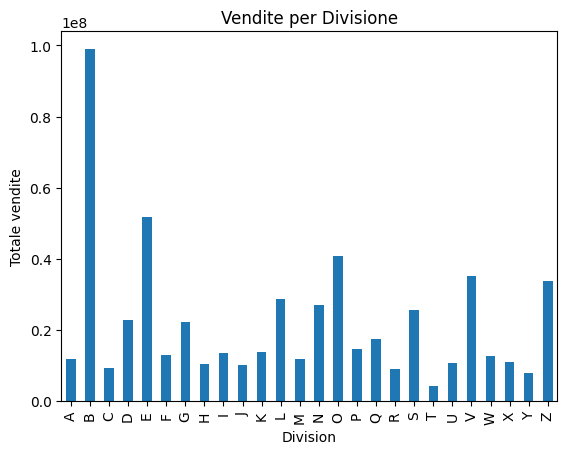

In [89]:
df.groupby('Division')['Sales'].sum().plot(kind='bar')
plt.title("Vendite per Divisione")
plt.ylabel("Totale vendite")
plt.show()


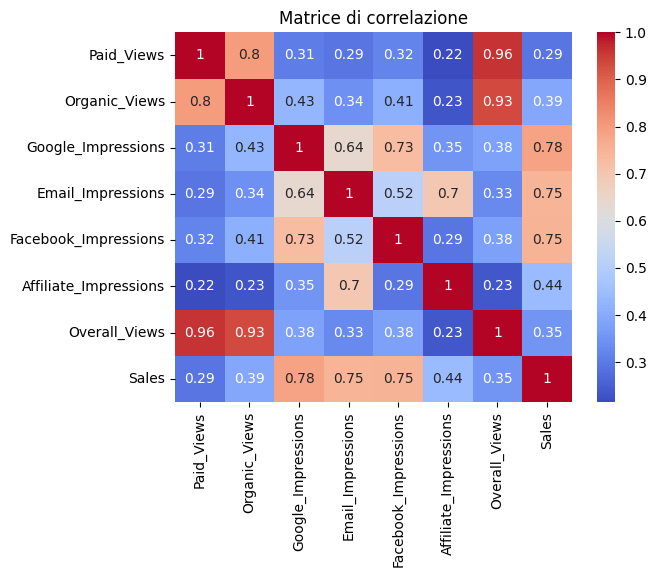

In [93]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.heatmap(df1.corr(), annot=True, cmap="coolwarm")
plt.title("Matrice di correlazione")
plt.show()


In [41]:
df[['Google_Impressions', 'Email_Impressions', 'Facebook_Impressions', 'Affiliate_Impressions']].sum().round(2)


Google_Impressions       2.703716e+09
Email_Impressions        2.320314e+09
Facebook_Impressions     8.211061e+08
Affiliate_Impressions    6.990116e+07
dtype: float64

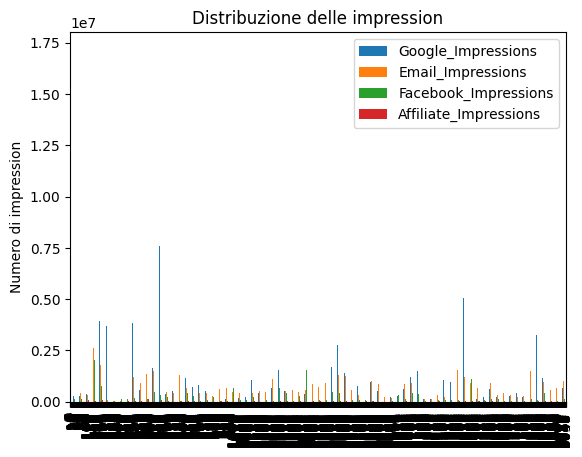

In [95]:
df[['Google_Impressions', 'Email_Impressions', 'Facebook_Impressions', 'Affiliate_Impressions']].plot(kind='bar')
plt.title("Distribuzione delle impression")
plt.ylabel("Numero di impression")
plt.show()


In [97]:
df['Paid_vs_Organic_Percentage'] = df['Paid_Views'] / df['Overall_Views'] * 100


In [98]:
df['Conversion_Rate'] = df['Sales'] / df['Overall_Views']


In [99]:
df['Impression_to_Sales_Ratio'] = df['Sales'] / (df['Google_Impressions'] + df['Email_Impressions'] +
                                                  df['Facebook_Impressions'] + df['Affiliate_Impressions'])


In [100]:
df['Rolling_Sales'] = df.groupby('Division')['Sales'].transform(lambda x: x.rolling(4).mean())


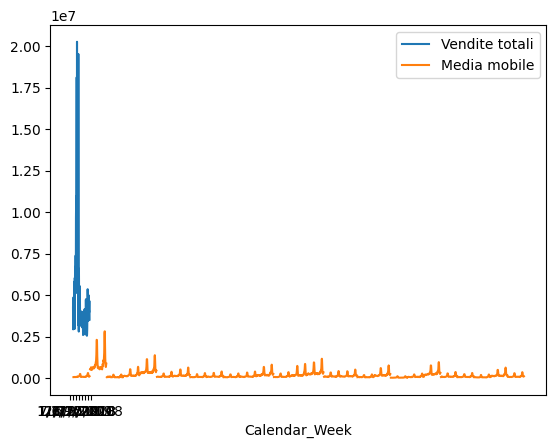

In [101]:
df.groupby('Calendar_Week')['Sales'].sum().plot()
df['Rolling_Sales'].plot()
plt.legend(["Vendite totali", "Media mobile"])
plt.show()


In [102]:
df[df['Sales'] > 20]


,Division,Calendar_Week,Paid_Views,Organic_Views,Google_Impressions,Email_Impressions,Facebook_Impressions,Affiliate_Impressions,Overall_Views,Sales,Paid_vs_Organic_Percentage,Conversion_Rate,Impression_to_Sales_Ratio,Rolling_Sales
0,A,1/6/2018,392,422,408,3.498950e+05,73580,12072,682,59417,57.478006,87.121701,0.136292,NaN
1,A,1/13/2018,787,904,110,5.062702e+05,11804,9499,853,56806,92.262603,66.595545,0.107652,NaN
2,A,1/20/2018,81,970,742,4.300422e+05,52232,17048,759,48715,10.671937,64.183136,0.097418,NaN
3,A,1/27/2018,25,575,65,4.177457e+05,78640,10207,942,72047,2.653928,76.483015,0.142201,59246.25
4,A,2/3/2018,565,284,295,4.085058e+05,40561,5834,658,56235,85.866261,85.463526,0.123540,58450.75
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3046,Z,2/1/2020,29239,25311,622406,1.459071e+06,45026,12098,53667,82707,54.482270,1.541115,0.038673,89782.25
3047,Z,2/8/2020,26230,28031,624409,5.342505e+05,227070,9548,53665,84503,48.877294,1.574639,0.060564,87367.00
3048,Z,2/15/2020,24749,31281,439362,4.227182e+05,393685,9861,55561,147325,44.543835,2.651590,0.116405,98005.50
3049,Z,2/22/2020,20713,30356,464178,6.085799e+05,424676,10221,49221,111525,42.081632,2.265801,0.073972,106515.00


In [103]:
df[df['Paid_Views'] > df['Paid_Views'].median()]


,Division,Calendar_Week,Paid_Views,Organic_Views,Google_Impressions,Email_Impressions,Facebook_Impressions,Affiliate_Impressions,Overall_Views,Sales,Paid_vs_Organic_Percentage,Conversion_Rate,Impression_to_Sales_Ratio,Rolling_Sales
48,A,12/8/2018,24788,1632,558879,4.258051e+05,68776,5247,26253,187382,94.419685,7.137546,0.176991,250116.75
49,A,12/15/2018,20699,2982,462233,3.540469e+05,146088,4837,23170,190487,89.335347,8.221278,0.196946,245620.00
50,A,12/22/2018,9967,3548,405196,3.452593e+05,60643,5060,12683,109947,78.585508,8.668848,0.134713,188529.00
51,A,12/29/2018,7077,3641,428545,4.862113e+05,46804,5208,10368,66448,68.258102,6.408951,0.068732,138566.00
52,A,1/5/2019,6132,3471,391548,4.853858e+05,19462,6301,7952,69510,77.112676,8.741197,0.077003,109098.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3046,Z,2/1/2020,29239,25311,622406,1.459071e+06,45026,12098,53667,82707,54.482270,1.541115,0.038673,89782.25
3047,Z,2/8/2020,26230,28031,624409,5.342505e+05,227070,9548,53665,84503,48.877294,1.574639,0.060564,87367.00
3048,Z,2/15/2020,24749,31281,439362,4.227182e+05,393685,9861,55561,147325,44.543835,2.651590,0.116405,98005.50
3049,Z,2/22/2020,20713,30356,464178,6.085799e+05,424676,10221,49221,111525,42.081632,2.265801,0.073972,106515.00


In [71]:
from ydata_profiling import ProfileReport

# Crea il report con YData Profiling
profile = ProfileReport(df, title="Profilo dei Dati", explorative=True)
profile.to_notebook_iframe()

# Salva il report come HTML
#profile.to_file("ydata_profiling_report.html")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

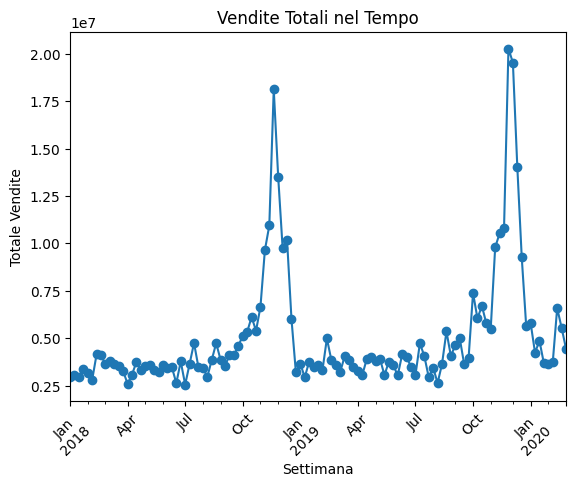

In [108]:
# Grafico delle vendite nel tempo
df.groupby('Calendar_Week')['Sales'].sum().plot(marker='o', linestyle='-', title='Vendite Totali nel Tempo')
plt.xlabel('Settimana')
plt.ylabel('Totale Vendite')
plt.xticks(rotation=45)
plt.show()


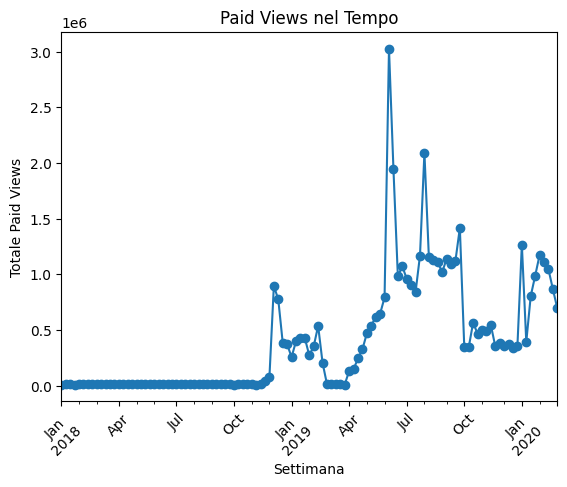

In [109]:
df.groupby('Calendar_Week')['Paid_Views'].sum().plot(marker='o', linestyle='-', title='Paid Views nel Tempo')
plt.xlabel('Settimana')
plt.ylabel('Totale Paid Views')
plt.xticks(rotation=45)
plt.show()


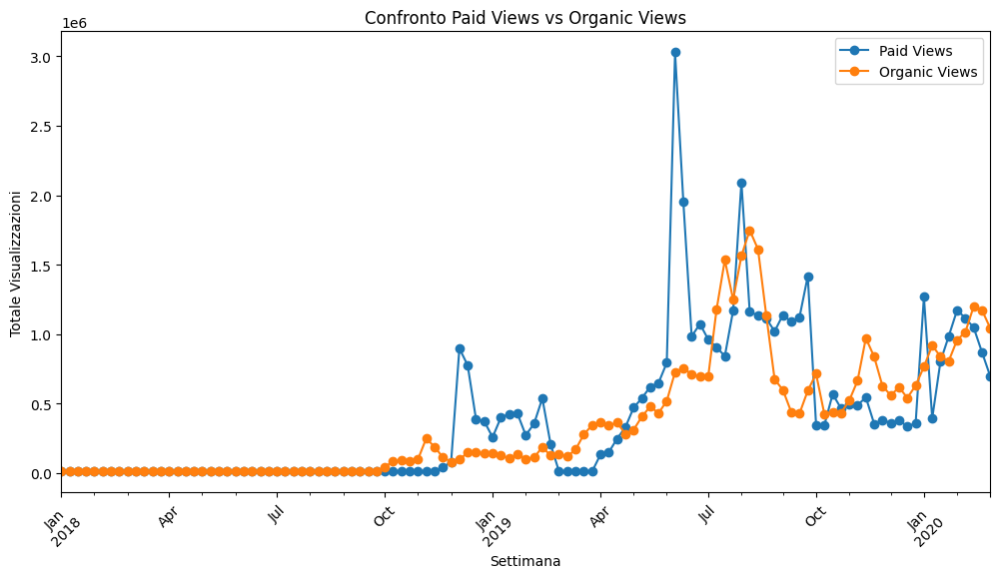

In [110]:
df.groupby('Calendar_Week')[['Paid_Views', 'Organic_Views']].sum().plot(marker='o', linestyle='-', figsize=(12, 6))
plt.title('Confronto Paid Views vs Organic Views')
plt.xlabel('Settimana')
plt.ylabel('Totale Visualizzazioni')
plt.legend(['Paid Views', 'Organic Views'])
plt.xticks(rotation=45)
plt.show()


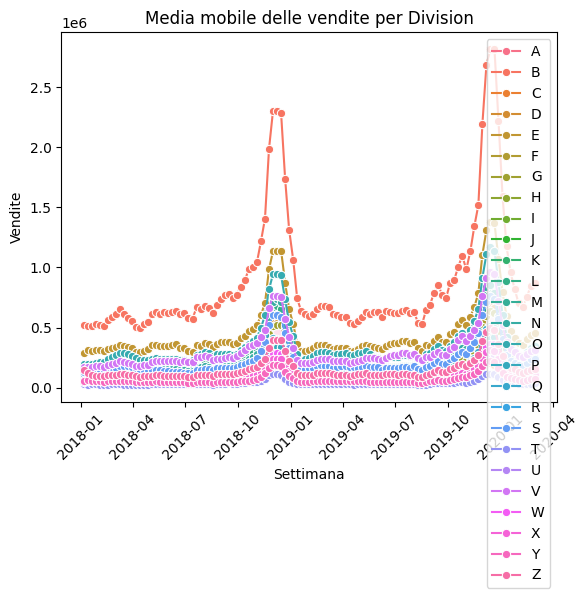

In [111]:
df['Rolling_Sales'] = df.groupby('Division')['Sales'].transform(lambda x: x.rolling(window=4, min_periods=1).mean())

sns.lineplot(x='Calendar_Week', y='Rolling_Sales', hue='Division', data=df, marker='o')
plt.title('Media mobile delle vendite per Division')
plt.xlabel('Settimana')
plt.ylabel('Vendite')
plt.xticks(rotation=45)
plt.legend()
plt.show()


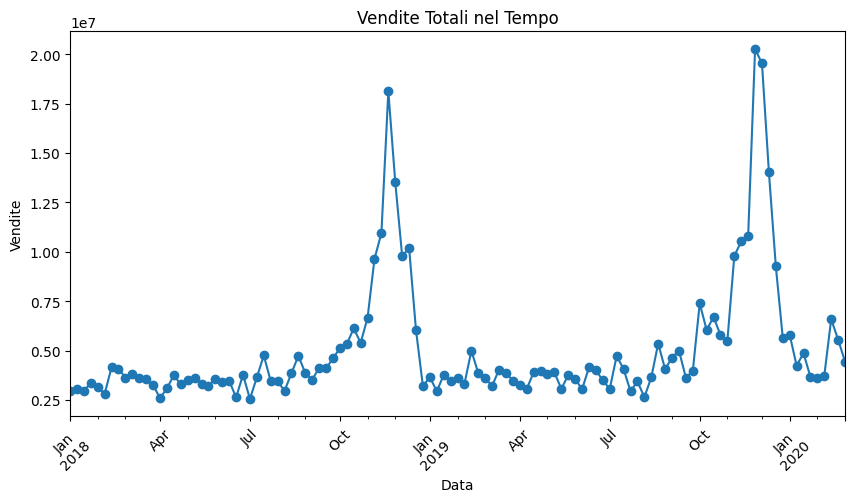

In [112]:
df.groupby('Calendar_Week')['Sales'].sum().plot(marker='o', linestyle='-', figsize=(10, 5))
plt.title('Vendite Totali nel Tempo')
plt.xlabel('Data')
plt.ylabel('Vendite')
plt.xticks(rotation=45)
plt.show()


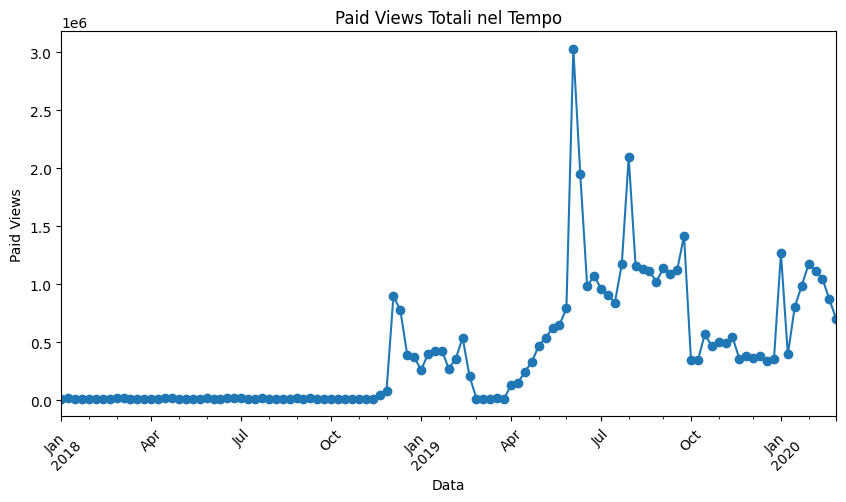

In [113]:
df.groupby('Calendar_Week')['Paid_Views'].sum().plot(marker='o', linestyle='-', figsize=(10, 5))
plt.title('Paid Views Totali nel Tempo')
plt.xlabel('Data')
plt.ylabel('Paid Views')
plt.xticks(rotation=45)
plt.show()


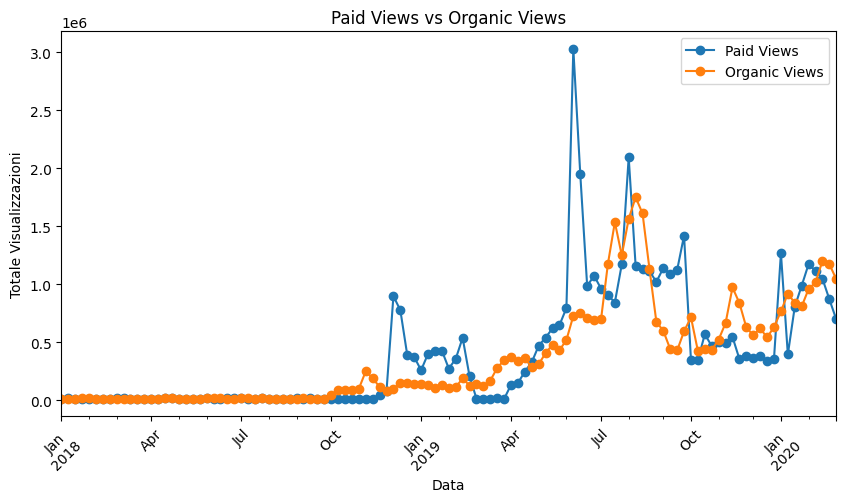

In [114]:
df.groupby('Calendar_Week')[['Paid_Views', 'Organic_Views']].sum().plot(marker='o', figsize=(10, 5))
plt.title('Paid Views vs Organic Views')
plt.xlabel('Data')
plt.ylabel('Totale Visualizzazioni')
plt.legend(['Paid Views', 'Organic Views'])
plt.xticks(rotation=45)
plt.show()


C:\Users\Utente\AppData\Local\Temp\ipykernel_14792\886627153.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Division', y='Sales', data=df, palette="muted")


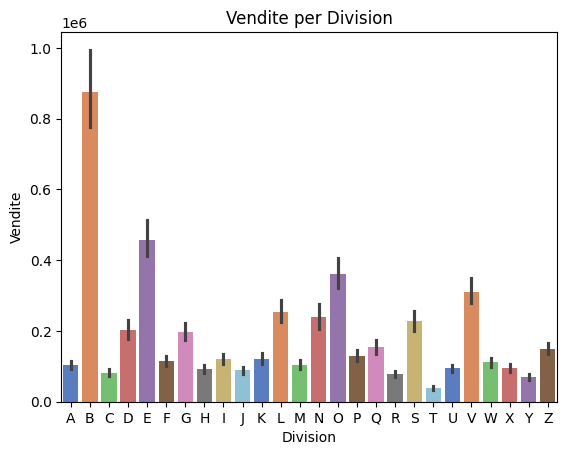

In [115]:
sns.barplot(x='Division', y='Sales', data=df, palette="muted")
plt.title('Vendite per Division')
plt.xlabel('Division')
plt.ylabel('Vendite')
plt.show()


C:\Users\Utente\AppData\Local\Temp\ipykernel_14792\3820791365.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Division', y='Paid_Views', data=df, palette="coolwarm")


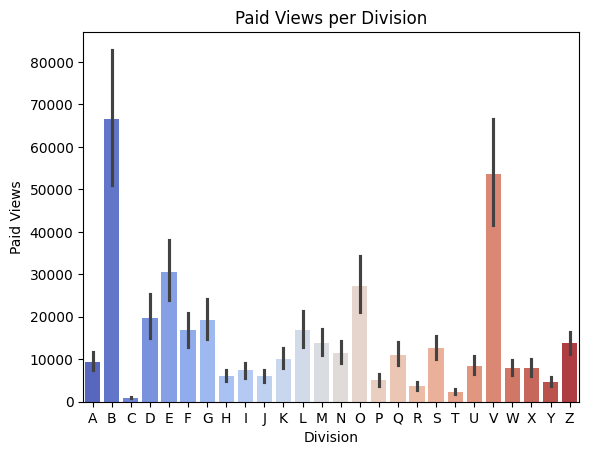

In [116]:
sns.barplot(x='Division', y='Paid_Views', data=df, palette="coolwarm")
plt.title('Paid Views per Division')
plt.xlabel('Division')
plt.ylabel('Paid Views')
plt.show()


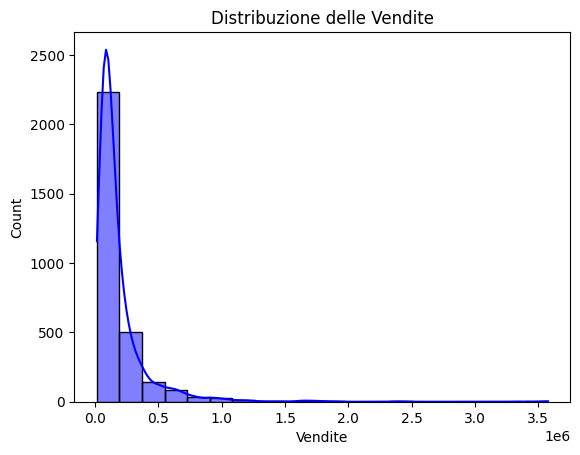

In [117]:
sns.histplot(df['Sales'], kde=True, color='blue', bins=20)
plt.title('Distribuzione delle Vendite')
plt.xlabel('Vendite')
plt.show()


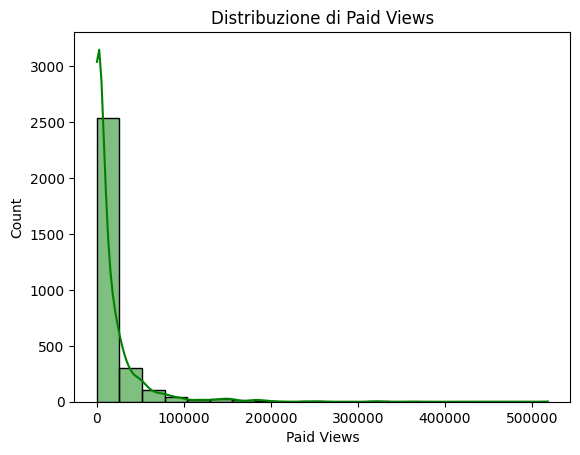

In [118]:
sns.histplot(df['Paid_Views'], kde=True, color='green', bins=20)
plt.title('Distribuzione di Paid Views')
plt.xlabel('Paid Views')
plt.show()


C:\Users\Utente\AppData\Local\Temp\ipykernel_14792\3820044304.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Division', y='Sales', data=df, palette="coolwarm")


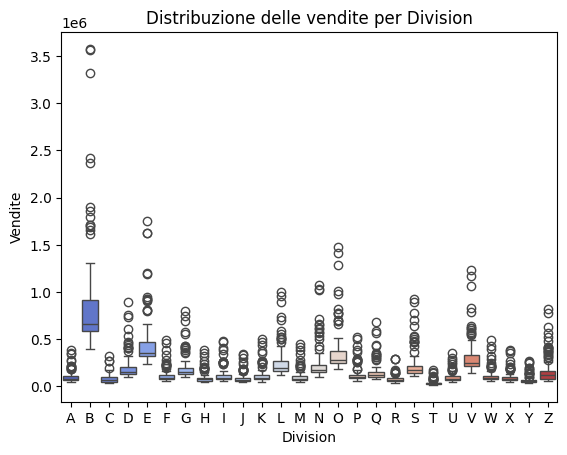

In [119]:
sns.boxplot(x='Division', y='Sales', data=df, palette="coolwarm")
plt.title('Distribuzione delle vendite per Division')
plt.xlabel('Division')
plt.ylabel('Vendite')
plt.show()


C:\Users\Utente\AppData\Local\Temp\ipykernel_14792\3568383817.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Division', y='Sales', data=df, inner='quartile', palette="muted")


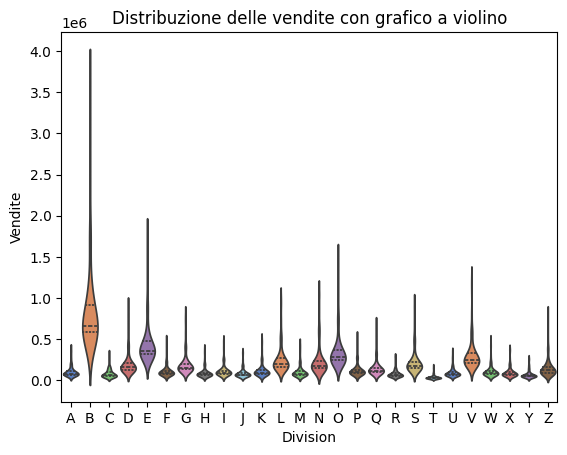

In [120]:
sns.violinplot(x='Division', y='Sales', data=df, inner='quartile', palette="muted")
plt.title('Distribuzione delle vendite con grafico a violino')
plt.xlabel('Division')
plt.ylabel('Vendite')
plt.show()


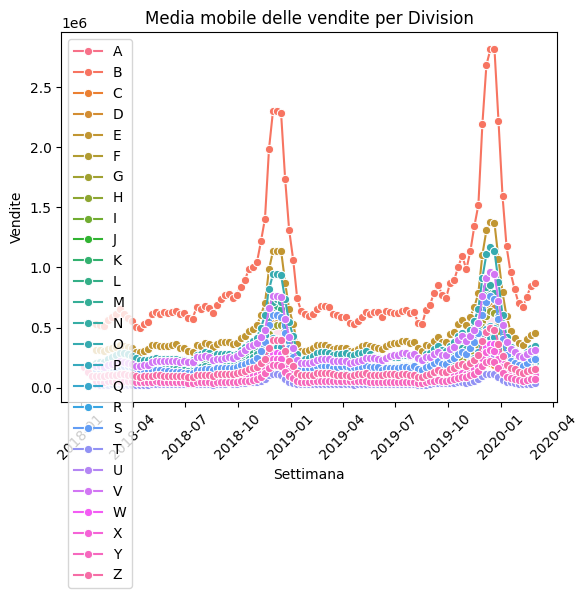

In [121]:
df['Rolling_Sales'] = df.groupby('Division')['Sales'].transform(lambda x: x.rolling(4).mean())

sns.lineplot(x='Calendar_Week', y='Rolling_Sales', hue='Division', data=df, marker='o')
plt.title('Media mobile delle vendite per Division')
plt.xlabel('Settimana')
plt.ylabel('Vendite')
plt.legend()
plt.xticks(rotation=45)
plt.show()


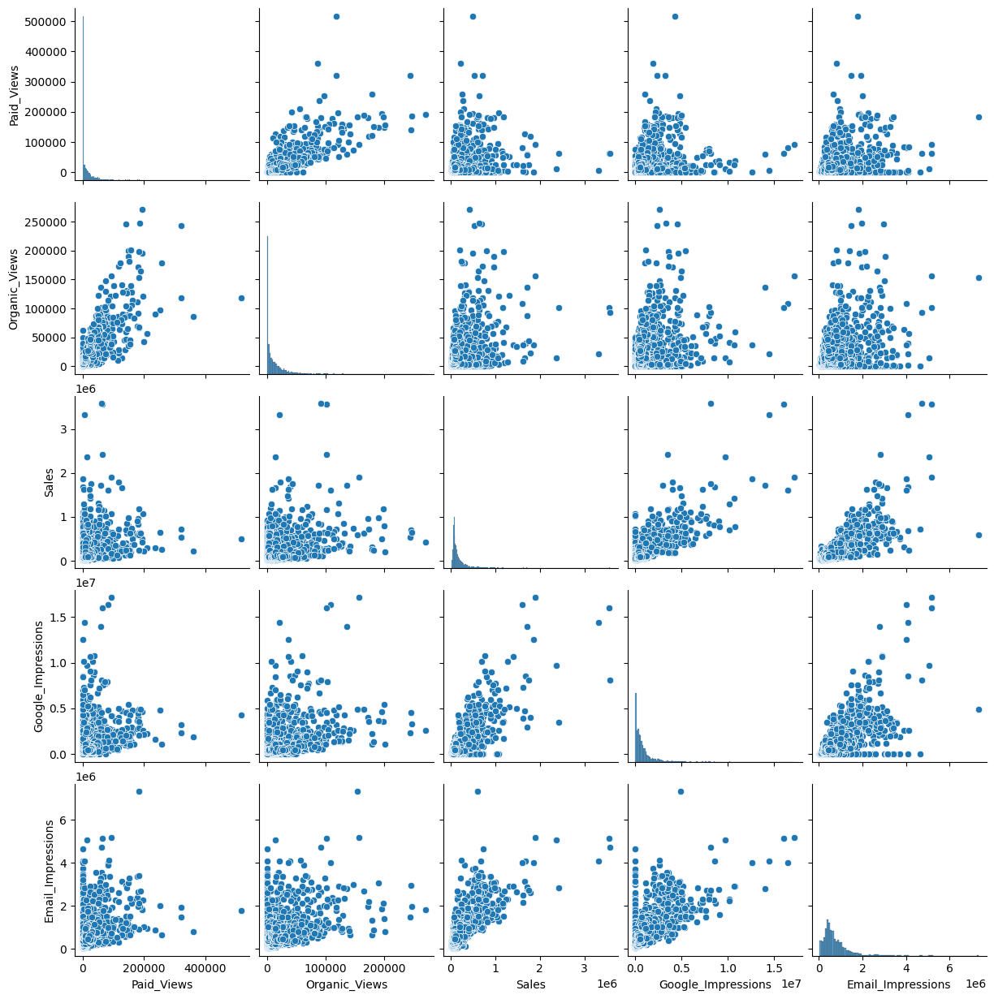

In [122]:
# Selezioniamo solo le variabili numeriche di interesse
sns.pairplot(df[['Paid_Views', 'Organic_Views', 'Sales', 'Google_Impressions', 'Email_Impressions']])
plt.show()


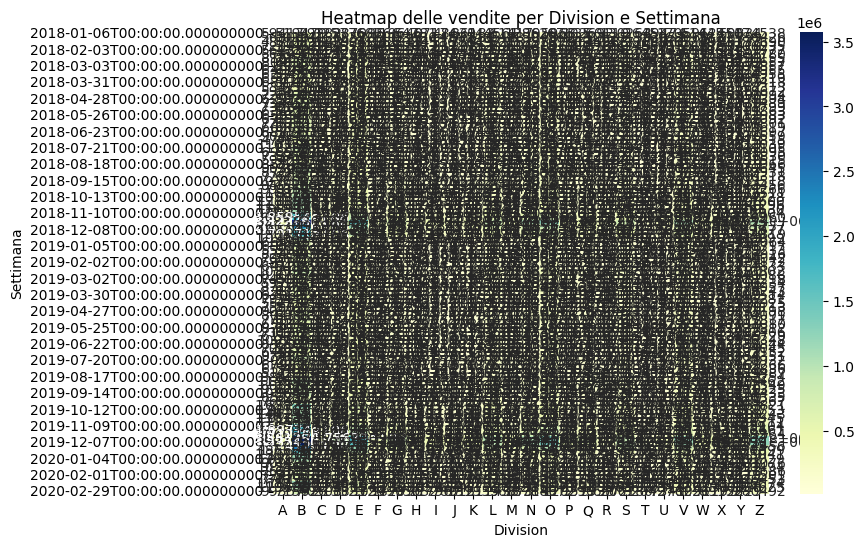

In [123]:
# Creazione della matrice di aggregazione per settimana e Division
pivot_table = df.pivot_table(values='Sales', index='Calendar_Week', columns='Division', aggfunc='sum')

plt.figure(figsize=(8, 6))
sns.heatmap(pivot_table, annot=True, fmt='g', cmap='YlGnBu')
plt.title('Heatmap delle vendite per Division e Settimana')
plt.xlabel('Division')
plt.ylabel('Settimana')
plt.show()


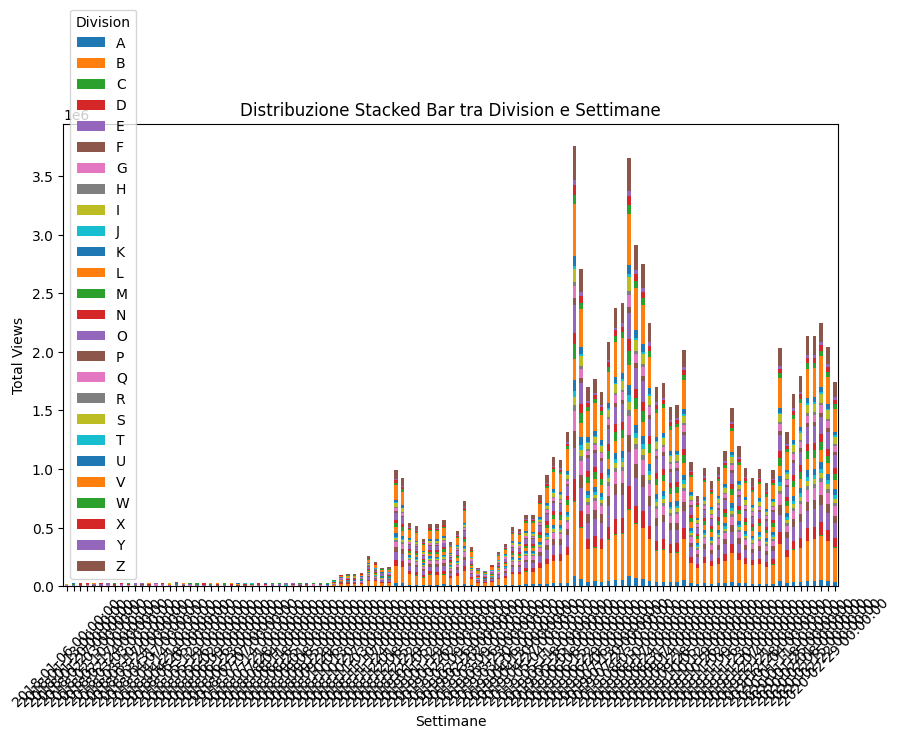

In [124]:
df['Total_Views'] = df['Paid_Views'] + df['Organic_Views']

pivot_stacked = df.pivot_table(values='Total_Views', index='Calendar_Week', columns='Division', aggfunc='sum')

pivot_stacked.plot(kind='bar', stacked=True, figsize=(10, 6))
plt.title('Distribuzione Stacked Bar tra Division e Settimane')
plt.xlabel('Settimane')
plt.ylabel('Total Views')
plt.xticks(rotation=45)
plt.legend(title="Division")
plt.show()


In [126]:
df1['Rolling_Paid_Views'] = df1['Paid_Views'].rolling(4).mean()
df1['Rolling_Organic_Views'] = df1['Organic_Views'].rolling(4).mean()

sns.lineplot(x='Calendar_Week', y='Rolling_Paid_Views', label='Rolling Paid Views', marker='o')
sns.lineplot(x='Calendar_Week', y='Rolling_Organic_Views', label='Rolling Organic Views', marker='o')
plt.title('Confronto tra Paid Views e Organic Views con Rolling Average')
plt.xlabel('Settimane')
plt.ylabel('Numero di Visualizzazioni')
plt.xticks(rotation=45)
plt.legend()
plt.show()


ValueError: Could not interpret value `Calendar_Week` for `x`. Value is a string, but `data` was not passed.

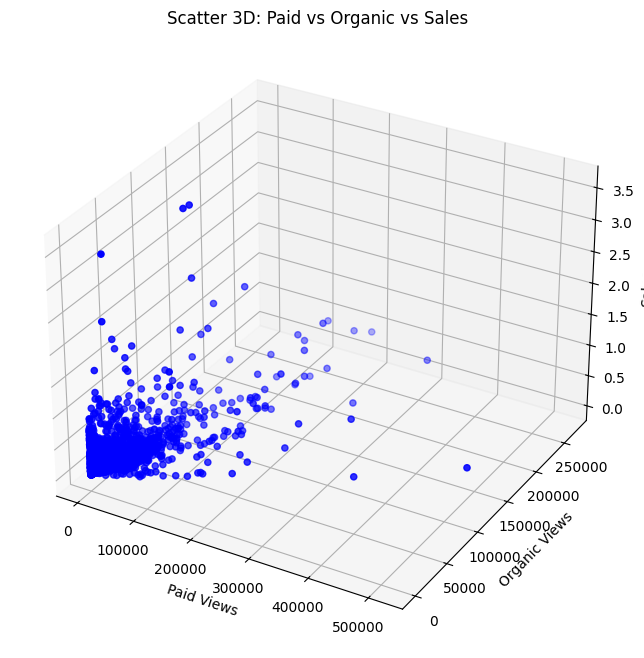

In [16]:
#from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

ax.scatter(df['Paid_Views'], df['Organic_Views'], df['Sales'], c='b', marker='o')

ax.set_xlabel('Paid Views')
ax.set_ylabel('Organic Views')
ax.set_zlabel('Sales')
plt.title('Scatter 3D: Paid vs Organic vs Sales')
plt.show()


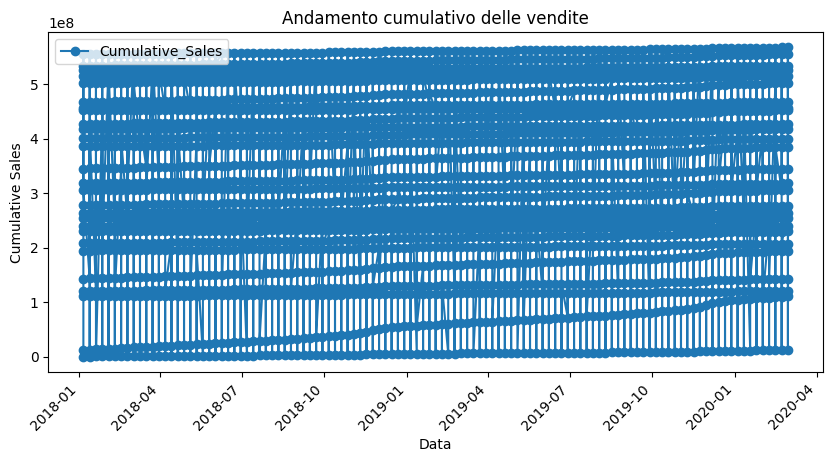

In [128]:
df['Cumulative_Sales'] = df['Sales'].cumsum()

df.plot(x='Calendar_Week', y='Cumulative_Sales', kind='line', marker='o', figsize=(10, 5))
plt.title('Andamento cumulativo delle vendite')
plt.xlabel('Data')
plt.ylabel('Cumulative Sales')
plt.xticks(rotation=45)
plt.show()


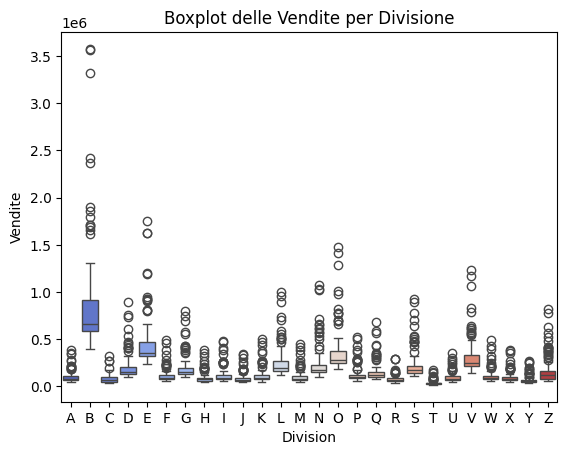

In [129]:
sns.boxplot(x='Division', y='Sales', hue='Division', data=df, palette="coolwarm")
plt.title('Boxplot delle Vendite per Divisione')
plt.xlabel('Division')
plt.ylabel('Vendite')
plt.show()


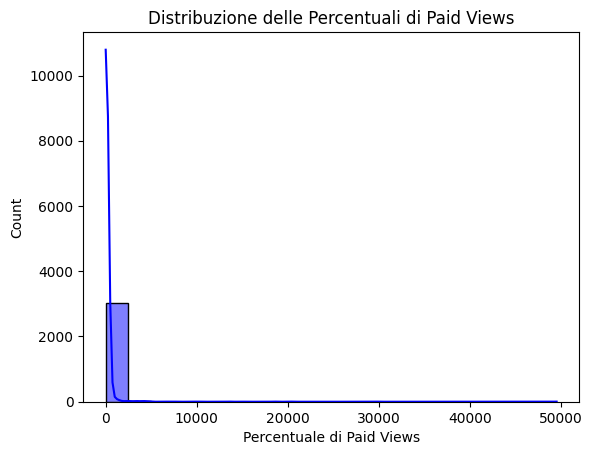

In [130]:
df['Paid_Percentage'] = (df['Paid_Views'] / df['Overall_Views']) * 100

sns.histplot(df['Paid_Percentage'].dropna(), kde=True, color='blue', bins=20)
plt.title('Distribuzione delle Percentuali di Paid Views')
plt.xlabel('Percentuale di Paid Views')
plt.show()


C:\Users\Utente\AppData\Local\Temp\ipykernel_14792\1294644195.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Division', y='Sales', data=df, ax=axes[0, 0], palette="coolwarm")


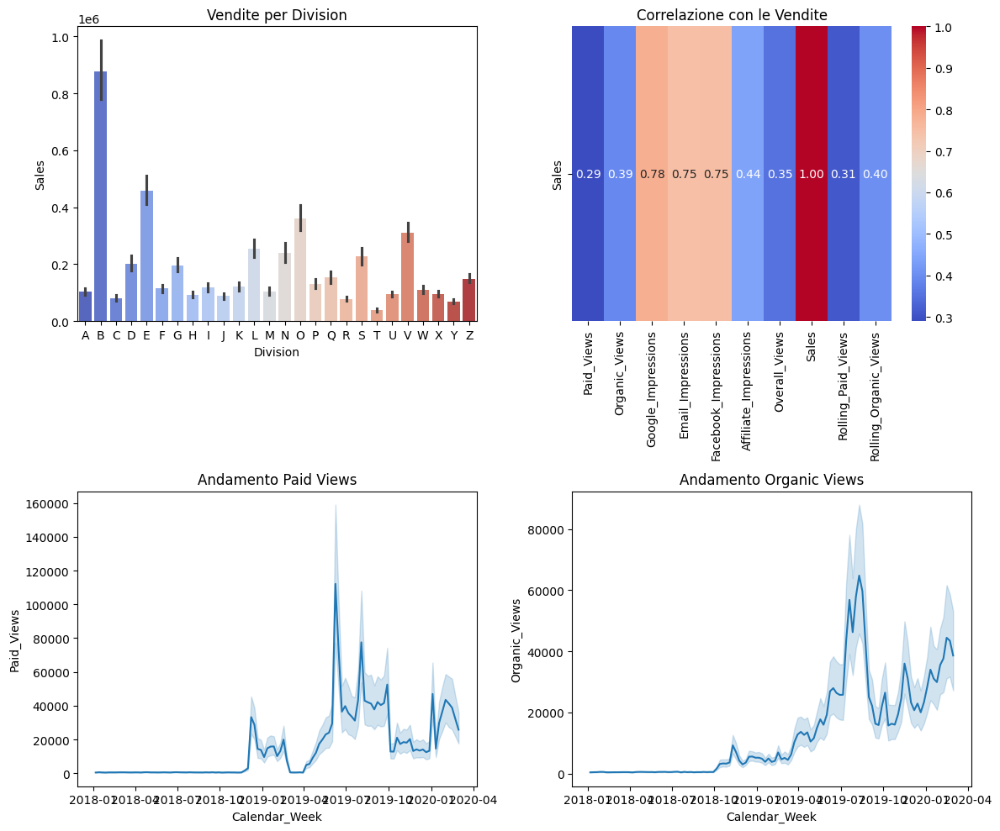

In [134]:
fig, axes = plt.subplots(2, 2, figsize=(12, 10))

sns.barplot(x='Division', y='Sales', data=df, ax=axes[0, 0], palette="coolwarm")
axes[0, 0].set_title('Vendite per Division')

sns.heatmap(df1.corr()[['Sales']].T, annot=True, fmt=".2f", cmap="coolwarm", ax=axes[0, 1])
axes[0, 1].set_title('Correlazione con le Vendite')

sns.lineplot(x='Calendar_Week', y='Paid_Views', data=df, ax=axes[1, 0])
axes[1, 0].set_title('Andamento Paid Views')

sns.lineplot(x='Calendar_Week', y='Organic_Views', data=df, ax=axes[1, 1])
axes[1, 1].set_title('Andamento Organic Views')

plt.tight_layout()
plt.show()


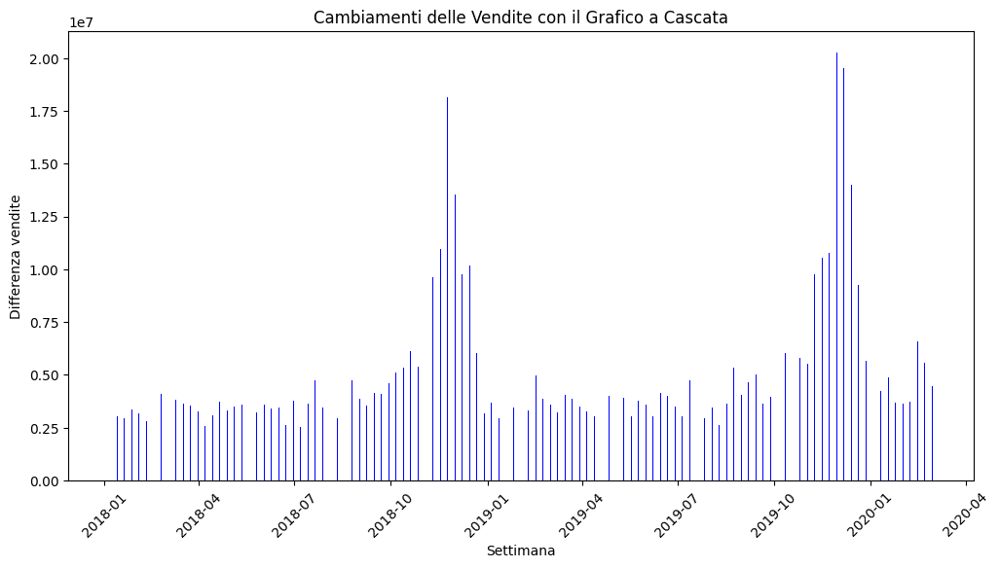

In [135]:
# Creazione di un grafico a cascata basato sulle vendite cumulative e Paid vs Organic
df_cumsum = df.groupby('Calendar_Week')['Sales'].sum().cumsum()

# Grafico a cascata
fig, ax = plt.subplots(figsize=(12, 6))
ax.bar(df_cumsum.index, df_cumsum.diff().fillna(0), color='blue')
ax.set_title('Cambiamenti delle Vendite con il Grafico a Cascata')
plt.xlabel('Settimana')
plt.ylabel('Differenza vendite')
plt.xticks(rotation=45)
plt.show()


C:\Users\Utente\AppData\Local\Temp\ipykernel_14792\3215420692.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=funnel_data.index, y=funnel_data.values, palette="viridis")


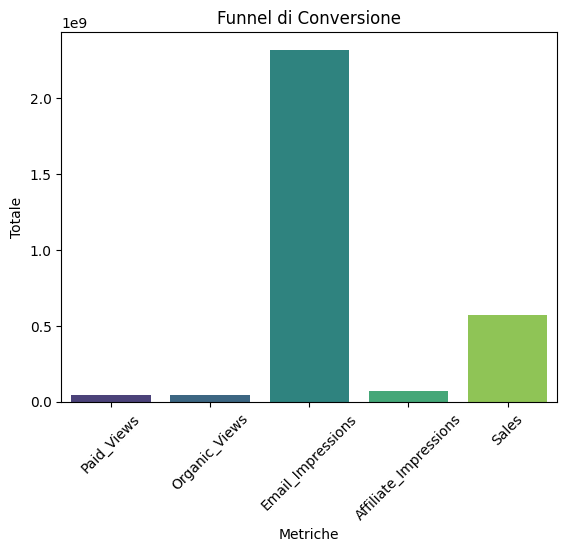

In [136]:
funnel_data = df[['Paid_Views', 'Organic_Views', 'Email_Impressions', 'Affiliate_Impressions', 'Sales']].sum()

sns.barplot(x=funnel_data.index, y=funnel_data.values, palette="viridis")
plt.title('Funnel di Conversione')
plt.xlabel('Metriche')
plt.ylabel('Totale')
plt.xticks(rotation=45)
plt.show()


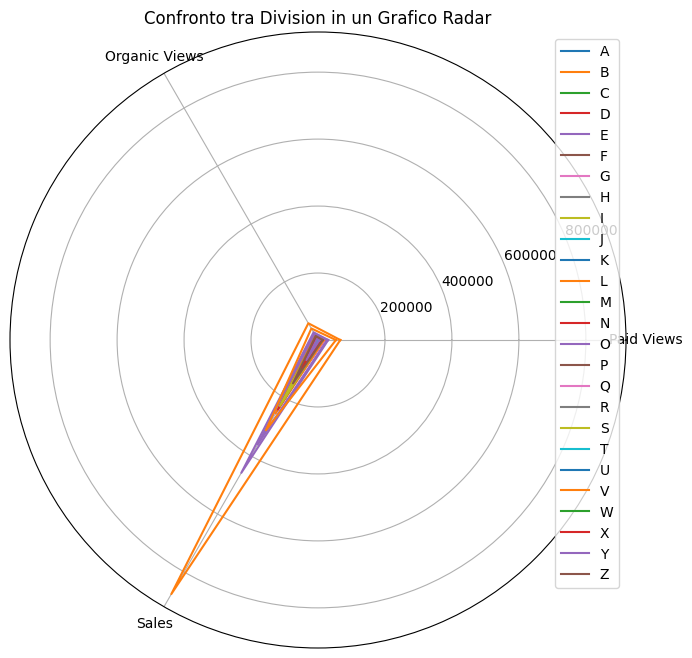

In [137]:
from math import pi

# Calcolo dei valori medi per ogni divisione
division_means = df.groupby('Division')[['Paid_Views', 'Organic_Views', 'Sales']].mean().reset_index()
num_vars = len(division_means.columns) - 1

# Impostazione degli angoli per il grafico radar
angles = [n / float(num_vars) * 2 * pi for n in range(num_vars)]
angles += angles[:1]  # Chiudere il ciclo del radar

fig, ax = plt.subplots(figsize=(8, 8), subplot_kw=dict(polar=True))

for i in range(len(division_means)):
    values = division_means.iloc[i].drop('Division').values.tolist()
    values += values[:1]  # Chiudere il ciclo
    ax.plot(angles, values, label=division_means['Division'].iloc[i])

ax.set_xticks(angles[:-1])
ax.set_xticklabels(['Paid Views', 'Organic Views', 'Sales'])

plt.legend()
plt.title("Confronto tra Division in un Grafico Radar")
plt.show()


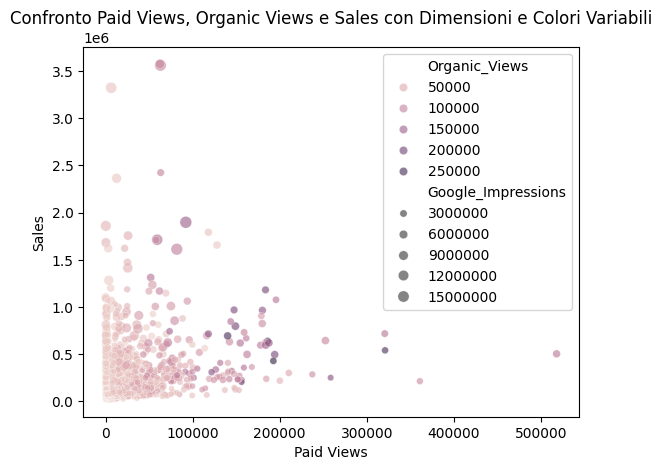

In [138]:
sns.scatterplot(x='Paid_Views', y='Sales', hue='Organic_Views', size='Google_Impressions', alpha=0.6, data=df)
plt.title('Confronto Paid Views, Organic Views e Sales con Dimensioni e Colori Variabili')
plt.xlabel('Paid Views')
plt.ylabel('Sales')
plt.legend()
plt.show()


C:\Users\Utente\AppData\Roaming\Python\Python311\site-packages\IPython\core\pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


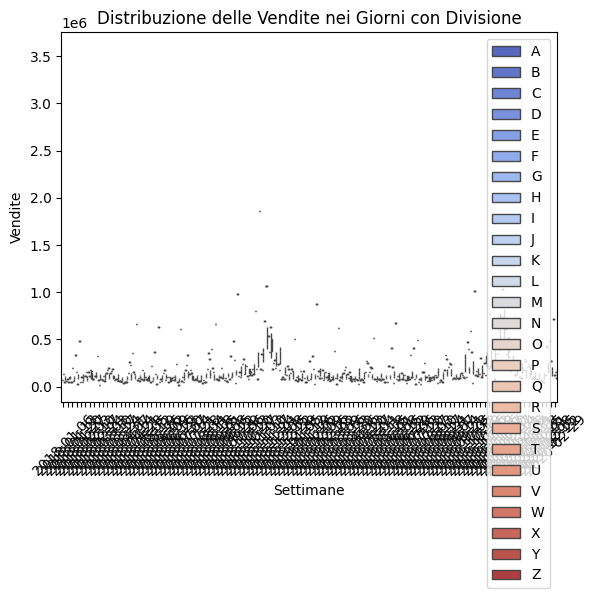

In [139]:
sns.boxplot(x='Calendar_Week', y='Sales', hue='Division', data=df, palette="coolwarm")
plt.xticks(rotation=45)
plt.title('Distribuzione delle Vendite nei Giorni con Divisione')
plt.xlabel('Settimane')
plt.ylabel('Vendite')
plt.legend()
plt.show()


In [140]:
sns.heatmap(df.pivot_table(values='Sales', index='Latitude', columns='Longitude'), cmap='coolwarm')
plt.title('Distribuzione Geografica delle Vendite')
plt.show()


KeyError: 'Latitude'

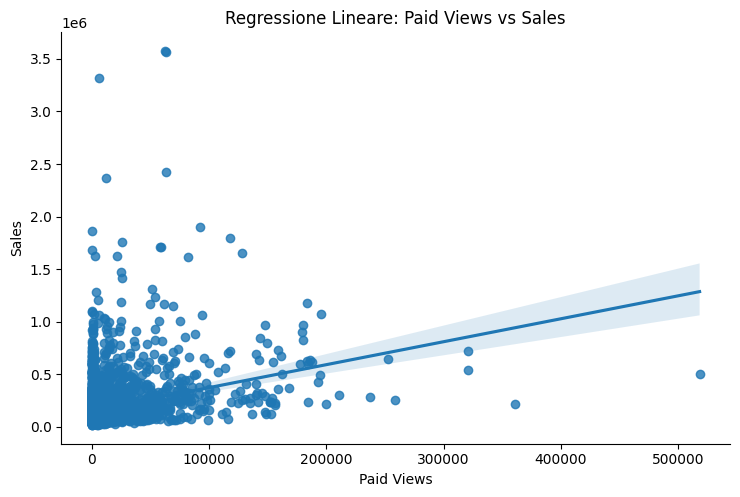

In [141]:
sns.lmplot(x='Paid_Views', y='Sales', data=df, aspect=1.5)
plt.title('Regressione Lineare: Paid Views vs Sales')
plt.xlabel('Paid Views')
plt.ylabel('Sales')
plt.show()


C:\Users\Utente\AppData\Local\Temp\ipykernel_14792\1617746123.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Division', y='Percentage', data=df_grouped, palette="coolwarm")


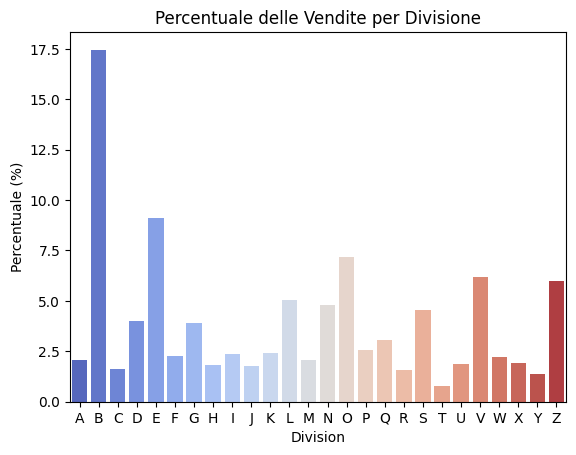

In [142]:
df_grouped = df.groupby('Division')['Sales'].sum().reset_index()
df_grouped['Percentage'] = (df_grouped['Sales'] / df_grouped['Sales'].sum()) * 100

sns.barplot(x='Division', y='Percentage', data=df_grouped, palette="coolwarm")
plt.title('Percentuale delle Vendite per Divisione')
plt.xlabel('Division')
plt.ylabel('Percentuale (%)')
plt.show()


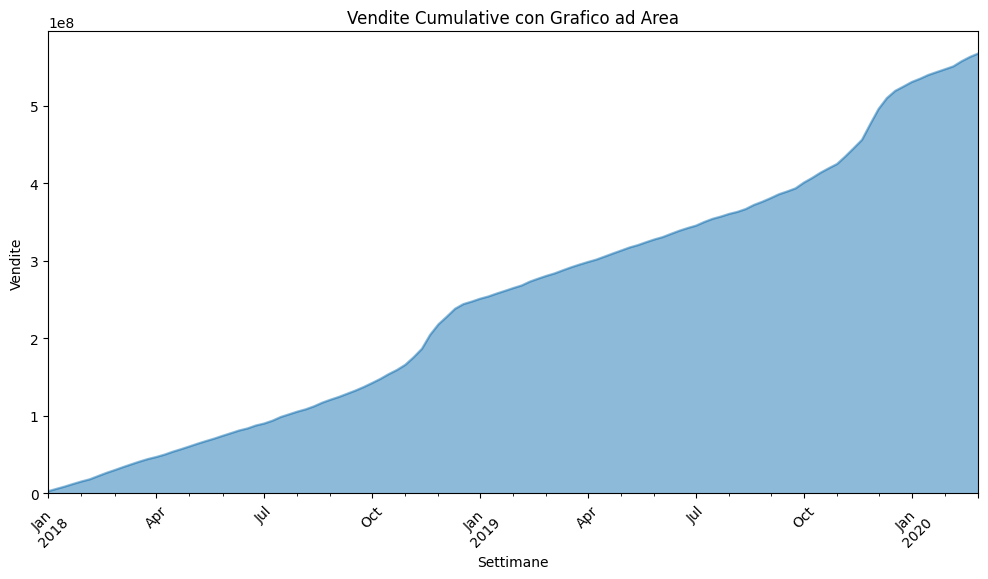

In [143]:
df_grouped_time = df.groupby('Calendar_Week')['Sales'].sum().cumsum()

df_grouped_time.plot(kind='area', figsize=(12, 6), alpha=0.5)
plt.title('Vendite Cumulative con Grafico ad Area')
plt.xlabel('Settimane')
plt.ylabel('Vendite')
plt.xticks(rotation=45)
plt.show()


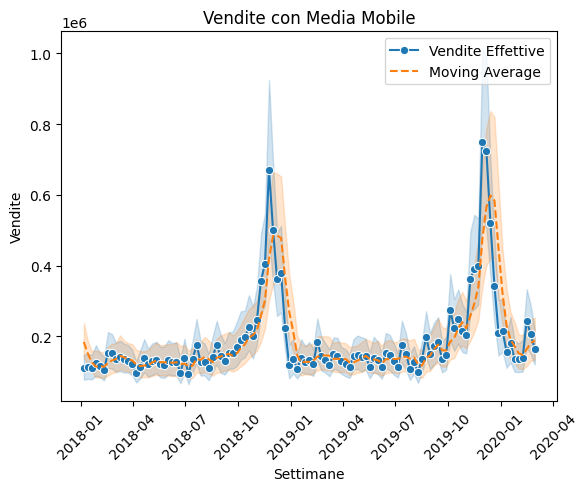

In [144]:
df['Moving_Avg_Sales'] = df['Sales'].rolling(window=4).mean()

sns.lineplot(x='Calendar_Week', y='Sales', label='Vendite Effettive', marker='o', data=df)
sns.lineplot(x='Calendar_Week', y='Moving_Avg_Sales', label='Moving Average', linestyle='--', data=df)
plt.title('Vendite con Media Mobile')
plt.xlabel('Settimane')
plt.ylabel('Vendite')
plt.xticks(rotation=45)
plt.legend()
plt.show()


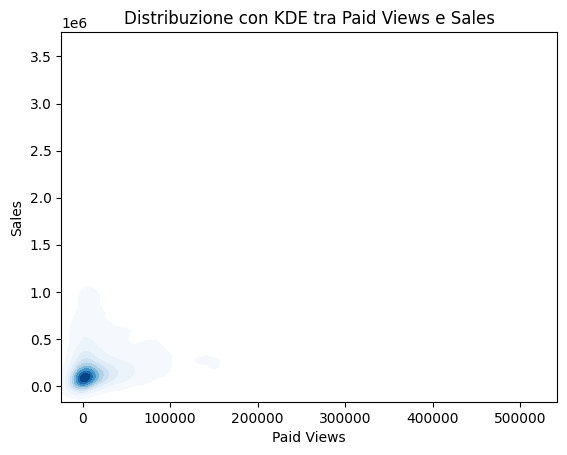

In [145]:
sns.kdeplot(x='Paid_Views', y='Sales', fill=True, cmap="Blues", data=df)
plt.title('Distribuzione con KDE tra Paid Views e Sales')
plt.xlabel('Paid Views')
plt.ylabel('Sales')
plt.show()


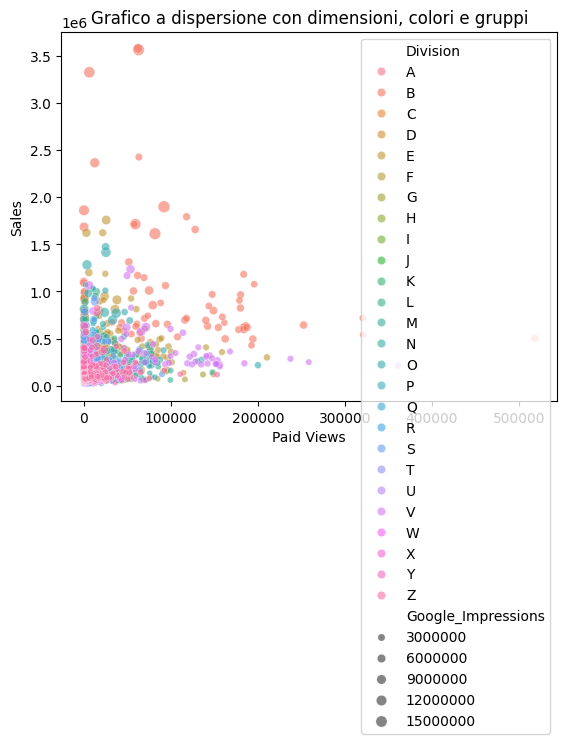

In [146]:
sns.scatterplot(x='Paid_Views', y='Sales', hue='Division', size='Google_Impressions', alpha=0.6, data=df)
plt.title('Grafico a dispersione con dimensioni, colori e gruppi')
plt.xlabel('Paid Views')
plt.ylabel('Sales')
plt.legend()
plt.show()


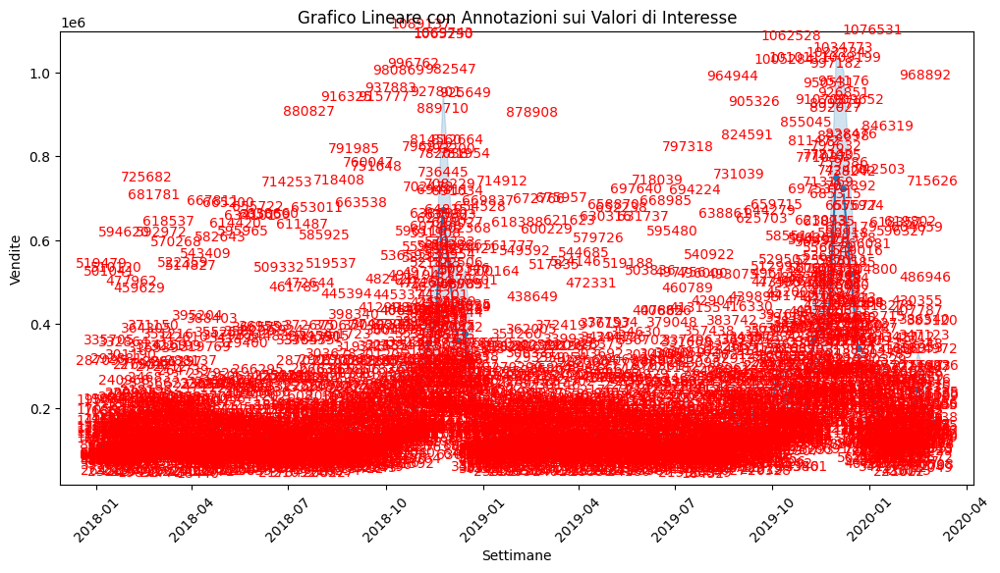

In [147]:
plt.figure(figsize=(12, 6))
sns.lineplot(x='Calendar_Week', y='Sales', data=df, marker='o')
for idx, row in df.iterrows():
    if row['Sales'] > 12:  # Evidenziare valori significativi
        plt.annotate(
            f'{row["Sales"]}', 
            (row['Calendar_Week'], row['Sales']), 
            textcoords="offset points", 
            xytext=(0, 5), 
            ha='center',
            fontsize=10,
            color='red'
        )
plt.title('Grafico Lineare con Annotazioni sui Valori di Interesse')
plt.xlabel('Settimane')
plt.ylabel('Vendite')
plt.xticks(rotation=45)
plt.show()


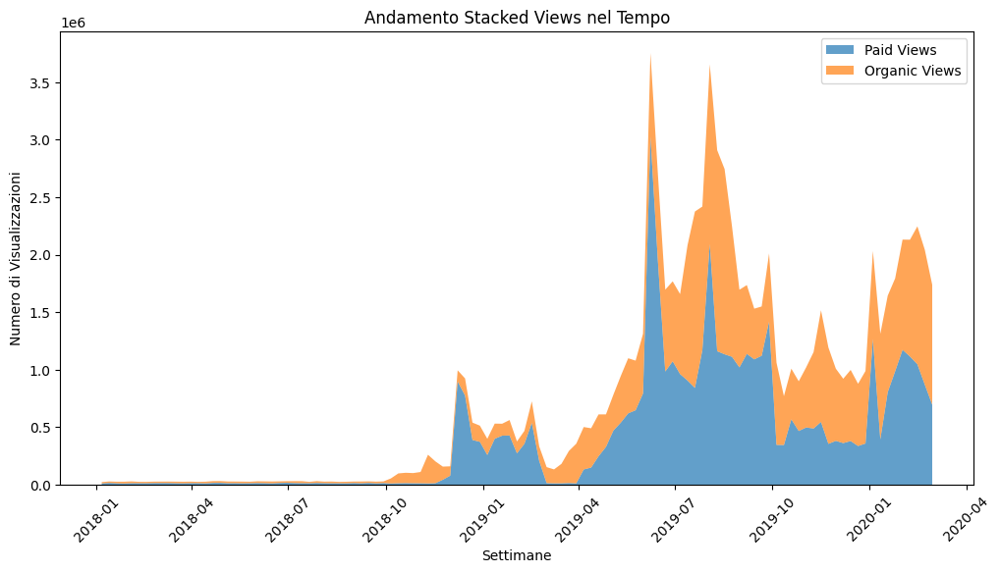

In [148]:
df_group = df.groupby('Calendar_Week')[['Paid_Views', 'Organic_Views']].sum()

plt.figure(figsize=(12, 6))
plt.stackplot(df_group.index, df_group['Paid_Views'], df_group['Organic_Views'], labels=['Paid Views', 'Organic Views'], alpha=0.7)
plt.title('Andamento Stacked Views nel Tempo')
plt.xlabel('Settimane')
plt.ylabel('Numero di Visualizzazioni')
plt.legend()
plt.xticks(rotation=45)
plt.show()


C:\Users\Utente\AppData\Roaming\Python\Python311\site-packages\IPython\core\pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


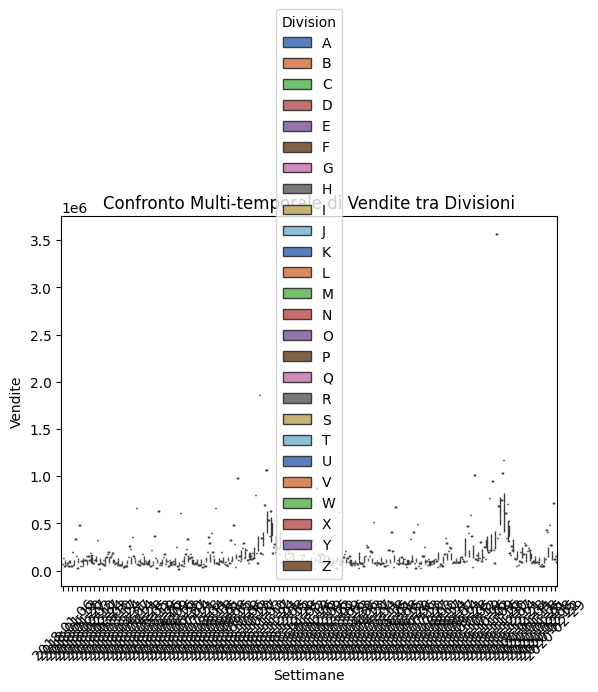

In [149]:
sns.boxplot(x='Calendar_Week', y='Sales', hue='Division', data=df, palette="muted")
plt.title('Confronto Multi-temporale di Vendite tra Divisioni')
plt.xlabel('Settimane')
plt.ylabel('Vendite')
plt.xticks(rotation=45)
plt.show()


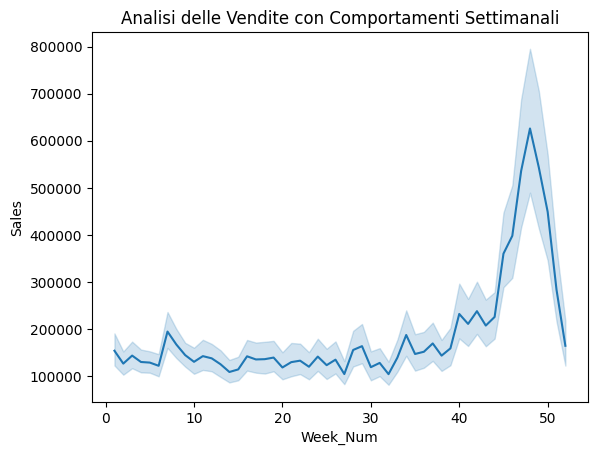

In [150]:
df['Week_Num'] = df['Calendar_Week'].dt.isocalendar().week
sns.lineplot(x='Week_Num', y='Sales', data=df)
plt.title("Analisi delle Vendite con Comportamenti Settimanali")
plt.show()


In [ ]:
from sklearn.cluster import KMeans

features = df[['Paid_Views', 'Organic_Views', 'Sales']].dropna()
kmeans = KMeans(n_clusters=4)
df['Cluster'] = kmeans.fit_predict(features)

sns.scatterplot(x='Paid_Views', y='Sales', hue='Cluster', data=df)
plt.title("Cluster Analysis con KMeans")
plt.show()


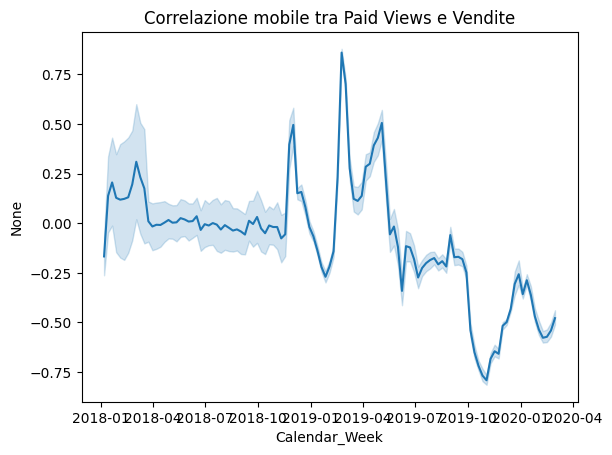

In [151]:
rolling_corr = df['Paid_Views'].rolling(12).corr(df['Sales'])
sns.lineplot(x=df['Calendar_Week'], y=rolling_corr)
plt.title('Correlazione mobile tra Paid Views e Vendite')
plt.show()


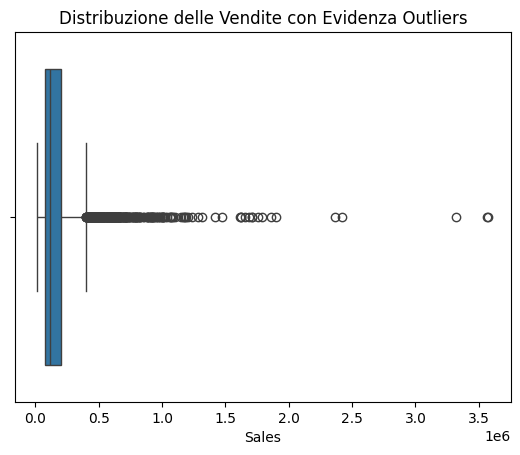

In [152]:
sns.boxplot(x=df['Sales'])
plt.title('Distribuzione delle Vendite con Evidenza Outliers')
plt.show()


C:\Users\Utente\AppData\Local\Temp\ipykernel_14792\2873712132.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Division', y='Sales', data=df_grouped_division, palette="viridis")


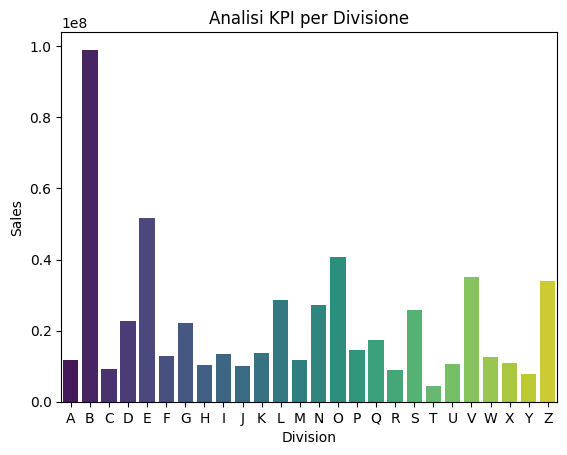

In [153]:
df_grouped_division = df.groupby('Division')[['Paid_Views', 'Organic_Views', 'Sales']].sum().reset_index()
sns.barplot(x='Division', y='Sales', data=df_grouped_division, palette="viridis")
plt.title("Analisi KPI per Divisione")
plt.show()


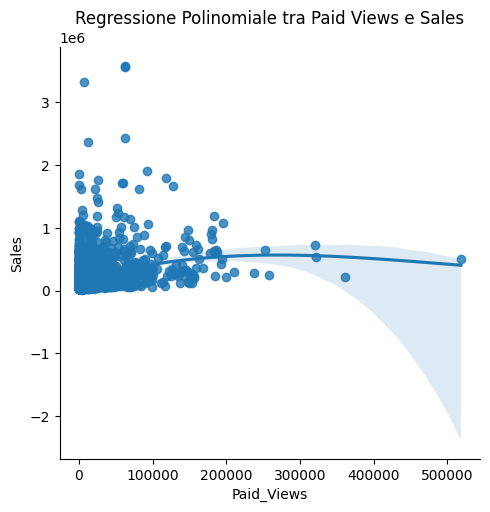

In [154]:
sns.lmplot(x='Paid_Views', y='Sales', data=df, order=3)  # Regressione non lineare
plt.title('Regressione Polinomiale tra Paid Views e Sales')
plt.show()


In [155]:
df_corr_time = df.groupby('Calendar_Week')[['Paid_Views', 'Sales']].corr().unstack().reset_index()
sns.heatmap(df_corr_time.pivot_table(index=0, columns=1), cmap='coolwarm')
plt.title('Correlazioni variabili su scala temporale')
plt.show()


KeyError: 0

C:\Users\Utente\AppData\Roaming\Python\Python311\site-packages\IPython\core\pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


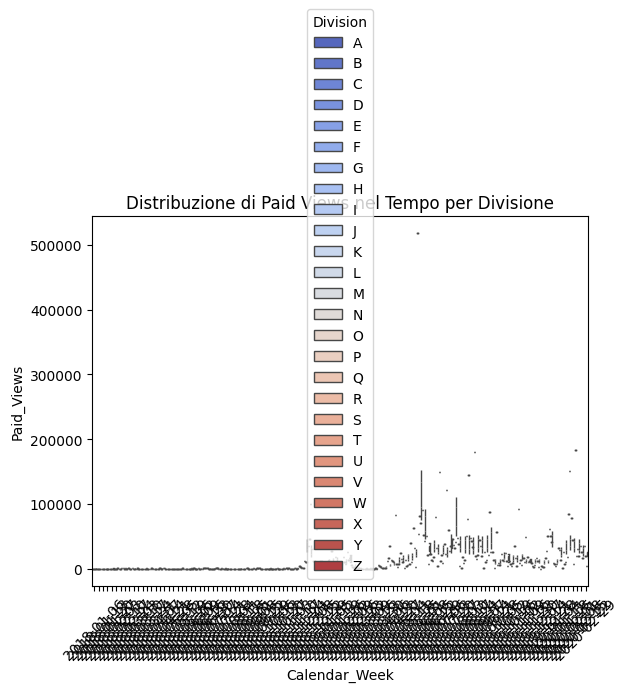

In [156]:
sns.boxplot(x='Calendar_Week', y='Paid_Views', hue='Division', data=df, palette='coolwarm')
plt.xticks(rotation=45)
plt.title('Distribuzione di Paid Views nel Tempo per Divisione')
plt.show()


In [157]:
sns.histplot(df['Sales'], kde=True, hue=df['Division'], multiple="stack")
plt.title('Distribuzione delle Vendite con Sovrapposizione per Divisione')
plt.show()


ValueError: The following variable cannot be assigned with wide-form data: `hue`

In [ ]:
df_grouped_cascade = df.groupby('Division')[['Paid_Views', 'Organic_Views', 'Sales']].sum().reset_index()
fig, ax = plt.subplots(figsize=(10, 6))

# Grafico a cascata con calcoli progressivi
ax.bar(df_grouped_cascade['Division'], df_grouped_cascade['Paid_Views'], color='blue')
ax.bar(df_grouped_cascade['Division'], df_grouped_cascade['Organic_Views'], bottom=df_grouped_cascade['Paid_Views'], color='green')
plt.ylabel("Valori")
plt.title('Effetto cumulativo di Paid e Organic Views')
plt.show()


In [ ]:
import squarify  # Libreria per la creazione di Treemaps

df_grouped = df.groupby('Division')['Sales'].sum().reset_index()
normed_values = df_grouped['Sales'] / df_grouped['Sales'].sum()

plt.figure(figsize=(12, 8))
squarify.squarify(normed_values, 0, 0, 100, 100, label=df_grouped['Division'])
plt.axis('off')
plt.title('Treemap delle Vendite per Divisione')
plt.show()


In [ ]:
import plotly.express as px

fig = px.scatter(df, x="Paid_Views", y="Sales", color="Division", hover_data=["Calendar_Week"])
fig.update_layout(title_text="Interattivo: Paid Views vs Sales con Divisione")
fig.show()


In [ ]:
from dowhy import CausalModel

model = CausalModel(
    data=df,
    treatment="Paid_Views",
    outcome="Sales",
    common_causes=["Google_Impressions", "Organic_Views"]
)

model.view_documentation()


In [ ]:
sns.set_style("whitegrid")
df['smoothed_sales'] = df['Sales'].rolling(window=10).mean()
sns.lineplot(x='Calendar_Week', y='smoothed_sales', data=df)
plt.title("Andamento delle Vendite con Smoothening")
plt.show()


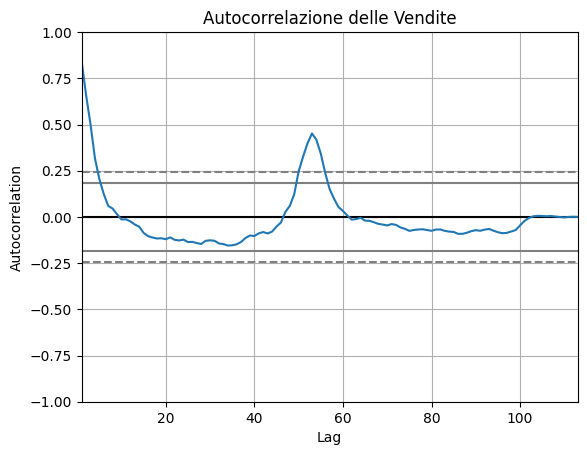

In [158]:
from pandas.plotting import autocorrelation_plot

df_grouped_time = df.groupby('Calendar_Week')['Sales'].sum()
autocorrelation_plot(df_grouped_time)
plt.title('Autocorrelazione delle Vendite')
plt.show()


In [159]:
pivot = df.pivot(index='Calendar_Week', columns='Division', values='Sales')
pivot_diff = pivot.pct_change().dropna()
pivot_diff.plot(kind='line', figsize=(12, 6))
plt.title("Variazione percentuale tra metriche successive")
plt.show()


ValueError: Index contains duplicate entries, cannot reshape

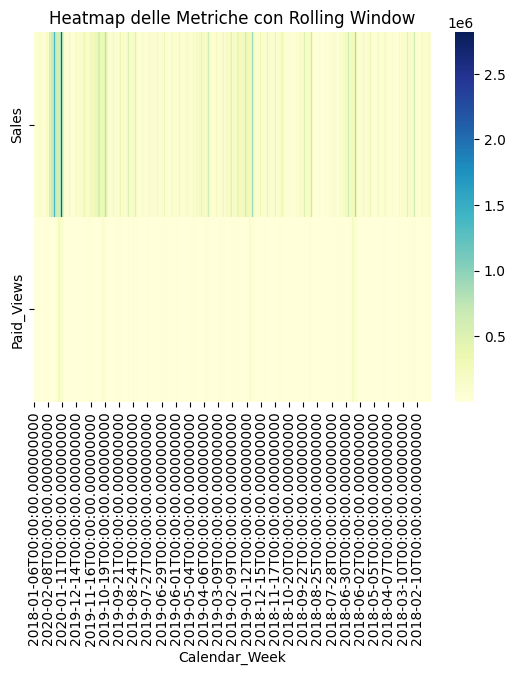

In [160]:
rolling_df = df.set_index('Calendar_Week')[['Sales', 'Paid_Views']].rolling(window=4).mean()
sns.heatmap(rolling_df.T, cmap="YlGnBu")
plt.title("Heatmap delle Metriche con Rolling Window")
plt.show()


TypeError: object of type 'ListedColormap' has no len()

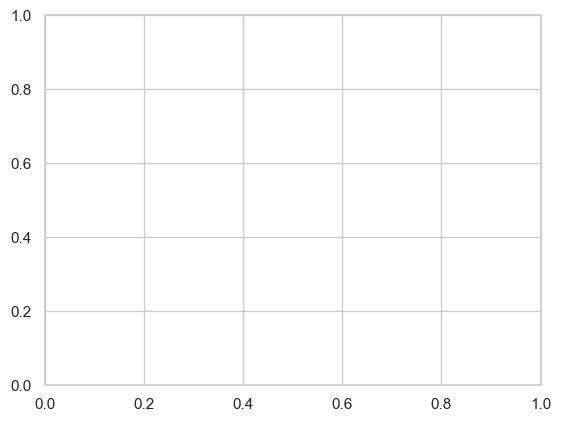

In [161]:
from pandas.plotting import parallel_coordinates

sns.set(style="whitegrid")
parallel_coordinates(df, 'Division', cols=['Paid_Views', 'Organic_Views', 'Sales'], color=plt.cm.viridis)
plt.title("Analisi Multi-Variata con Grafico Coordinate Parallele")
plt.show()


In [162]:
import plotly.graph_objects as go

fig = go.Figure(data=[go.Sankey(
    node=dict(
        pad=15,
        thickness=20,
        line=dict(color="black", width=0.5),
        label=["Paid_Views", "Organic_Views", "Sales"]
    ),
    link=dict(
        source=[0, 1, 0],
        target=[1, 2, 2],
        value=[100, 80, 120]
    )
)])

fig.update_layout(title_text="Flussi con Sankey Diagram", font_size=10)
fig.show()


In [163]:
import plotly.express as px

fig = px.sunburst(df, path=["Division", "Calendar_Week"], values="Sales")
fig.update_layout(title_text="Sunburst Diagram sulle Vendite per Divisione e Settimane")
fig.show()


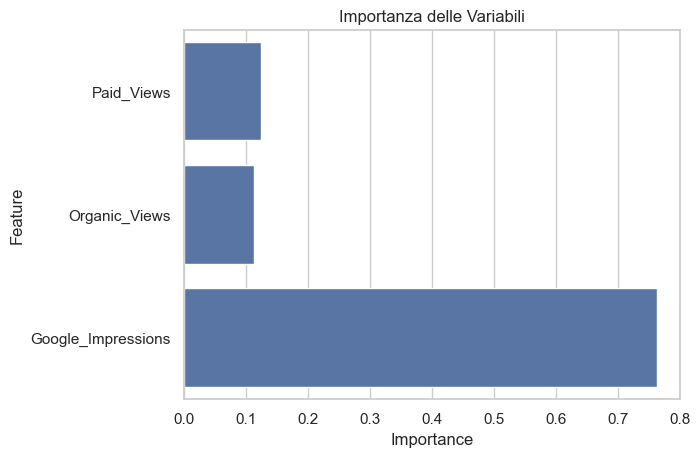

In [164]:
from sklearn.ensemble import RandomForestRegressor

X = df[['Paid_Views', 'Organic_Views', 'Google_Impressions']].dropna()
y = df['Sales'].dropna()

model = RandomForestRegressor()
model.fit(X, y)

feature_importance = pd.DataFrame({'Feature': X.columns, 'Importance': model.feature_importances_})
sns.barplot(x='Importance', y='Feature', data=feature_importance)
plt.title('Importanza delle Variabili')
plt.show()
